<a href="https://colab.research.google.com/github/buessow/glumagic/blob/master/modelling/Glucose_Prediction_C.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup

In [1]:
#@title Imports
%load_ext google.colab.data_table

from enum import Enum
import datetime as datetime
import json
import os
import hashlib
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
import datetime as datetime
import dateutil.parser
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.lines as lines
from matplotlib.patches import Rectangle
import matplotlib.table as tab
import math
import numpy as np
import pandas as pd
import pytz
import pprint
import statistics
import sys
import unittest
import subprocess
from datetime import datetime
from datetime import time
from datetime import timedelta
from datetime import timezone
from google.colab import data_table
from google.colab import drive
from google.colab import output as co_out
from scipy.signal import savgol_filter
from IPython import display as idisplay
import contextlib
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error

# from google.colab import userdata
from IPython.display import Javascript

#mpl.style.use('dark_background')
data_table._DEFAULT_FORMATTERS[float] = lambda x: f'{x:.2f}'
data_table._DEFAULT_FORMATTERS[np.float32] = lambda x: f'{x:.2f}'
data_table._DEFAULT_ROWS_PER_PAGE = 20

local_colab = 'COLAB_RELEASE_TAG' not in os.environ.keys()
CACHE_DIR = os.path.join(os.environ['HOME'], 'Google Drive', 'My Drive', 'Glucose Prediction Work')
if not os.path.exists(CACHE_DIR):
  local_colab = False
  CACHE_DIR = '/content/drive/My Drive/Glucose Prediction Work'

print(CACHE_DIR)

/Users/robertbuessow/Google Drive/My Drive/Glucose Prediction Work


In [2]:
#@title Import Library from Github
![ -d gmagic ] || git clone https://github.com/buessow/gmagic.git
!cd gmagic; git pull origin
from gmagic.lib import LogNormAction as lna
from gmagic.lib.DateTimeInsulin import DateTimeInsulin, TimeInsulin
from gmagic.lib.Profile import Profile
from gmagic.lib.ProfileSwitch import ProfileSwitch
from gmagic.lib.TempBasal import TempBasal

Already up to date.


In [3]:
![[ $local_colab == False ]] && apt-get install openjdk-17-jre-headless -qq > /dev/null
if not local_colab: os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-17-openjdk-amd64"
![[ $local_colab == False ]] && update-alternatives --set java /usr/lib/jvm/java-17-openjdk-amd64/bin/java
!java -version

java version "17.0.7" 2023-04-18 LTS
Java(TM) SE Runtime Environment (build 17.0.7+8-LTS-224)
Java HotSpot(TM) 64-Bit Server VM (build 17.0.7+8-LTS-224, mixed mode, sharing)


In [4]:
#@title Model Class
class M(object):
  def __init__(self, name, **kwargs):
    self.name = name
    self.test_data = []
    self.use_conv = False
    for k, v in kwargs.items():
      setattr(self, k, v)
    self.prev_error = {}
m = M('default')

In [5]:
#@title Model Data

M.START = '2021-01-01'
M.END = '2024-03-01'
M.VALIDATION = '2024-01-01'

M.FREQ_MINUTES = 5
M.FREQ = timedelta(minutes=M.FREQ_MINUTES)

M.TRAIN_MINUTES = 180
M.PRED_MINUTES = 60
M.PRED2_MINUTES = 60

@property
def MINUTES(self): return self.TRAIN_MINUTES + self.PRED_MINUTES
M.MINUTES = MINUTES

@property
def PERIOD_T(self): return timedelta(minutes=self.TRAIN_MINUTES)
M.PERIOD_T = PERIOD_T
del PERIOD_T

@property
def PERIOD_P(self): return timedelta(minutes=self.PRED_MINUTES)
M.PERIOD_P = PERIOD_P
del PERIOD_P

@property
def PERIOD(self): return self.PERIOD_T + timedelta(minutes=self.PRED2_MINUTES)
M.PERIOD = PERIOD
del PERIOD

@property
def PERIOD_X_MINUTES(self):
  return list(range(0, self.TRAIN_MINUTES, self.FREQ_MINUTES))
M.PERIOD_X_MINUTES = PERIOD_X_MINUTES

@property
def PERIOD_Y_MINUTES(self):
  return list(range(self.TRAIN_MINUTES, self.MINUTES, self.FREQ_MINUTES))
M.PERIOD_Y_MINUTES = PERIOD_Y_MINUTES

@property
def PERIOD_Y2_MINUTES(self):
  return list(range(self.TRAIN_MINUTES, self.TRAIN_MINUTES + self.PRED2_MINUTES, self.FREQ_MINUTES))
M.PERIOD_Y2_MINUTES = PERIOD_Y2_MINUTES

@property
def PERIOD_INPUT_MINUTES(self):
  return list(range(0, self.TRAIN_MINUTES + self.PRED2_MINUTES, self.FREQ_MINUTES))
M.PERIOD_INPUT_MINUTES = PERIOD_INPUT_MINUTES
del PERIOD_INPUT_MINUTES

@property
def PERIOD_MINUTES(self): return self.PERIOD_X_MINUTES + self.PERIOD_Y_MINUTES
M.PERIOD_MINUTES = PERIOD_MINUTES

M.HR_HIGH_THRESHOLD = 120
M.HR_LONG_MINUTES = [24 * 60, 48 * 60]
M.HR_LONG_COLS = ['hr_long', 'hr_lon2']

@property
def start_ts(self):
  return pd.to_datetime(self.START).tz_localize('UTC')
M.start_ts = start_ts
del start_ts

@property
def validation_start(self):
  return pd.to_datetime(self.VALIDATION).tz_localize('UTC')
M.validation_start = validation_start
del validation_start

history = pd.DataFrame()
history_file = os.path.join(CACHE_DIR, 'run_history.csv')
if os.path.exists(history_file):
  history = pd.read_csv(history_file)

m.validation_start

Timestamp('2024-01-01 00:00:00+0000', tz='UTC')

mode 0.500000
mode 0.750000


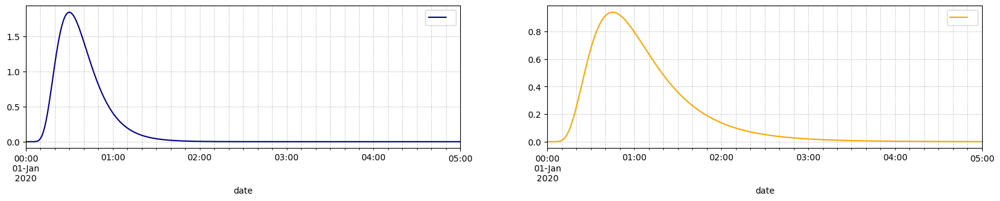

In [6]:
#@title Insulin and Carbohydrate Action
insulin_color = 'darkblue'
carb_color = 'orange'

M.INSULIN_ACTION = lna.LogNormAction(mode=timedelta(minutes=30), sigma=0.4)
M.CARB_ACTION = lna.LogNormAction(mode=timedelta(minutes=45), sigma=0.50)

_, axs = plt.subplots(nrows=1, ncols=2, subplot_kw={}, figsize=(20,3))
M.INSULIN_ACTION.plot(timedelta(hours=5), color=insulin_color, ax=axs[0])
M.CARB_ACTION.plot(timedelta(hours=5), color=carb_color, ax=axs[1])

# print('mean %f' % M.INSULIN_ACTION.mean)

# Data Loading

In [7]:
def write_meta_json(self, file_name):
  meta = {
      'tensorflow_version': tf.__version__,
      'trainingPeriodMinutes': self.TRAIN_MINUTES,
      'predictionPeriodMinutes': self.PRED_MINUTES,
      'carbAction': {'mu': self.CARB_ACTION.mu, 'sigma': self.CARB_ACTION.sigma },
      'insulinAction': {'mu': self.INSULIN_ACTION.mu, 'sigma': self.INSULIN_ACTION.sigma },
      'hrHighThreshold': self.HR_HIGH_THRESHOLD,
      'hrLongDurationMinutes': self.HR_LONG_MINUTES,
      'testData': self.test_data,
      'freqMinutes': self.FREQ_MINUTES,
      'zoneId': 'CET',
      'x_values': self.get_x_values() if hasattr(self, 'get_x_values') else []
  }
  with open(file_name, 'w') as f:
    json.dump(meta, f, indent=2)
  return meta
M.write_meta_json = write_meta_json
del write_meta_json

In [8]:
#@title Load Data

def load_data(self):
  meta_fname = '%s_load_meta.json' % self.name
  meta =  self.write_meta_json(meta_fname)
  meta['testData'] = None
  hash = hashlib.sha1(str(meta).encode()).hexdigest()
  fname = 'input_%s_%s_%s.csv' % (self.START, self.END, hash)
  if not os.path.exists(fname):
    print('loading "%s"' % fname)
    with open(CACHE_DIR + '/mongo.json') as f:
      mongo_config = json.load(f)
    p = subprocess.run(args=[
        'java',
        '-jar', os.path.join(CACHE_DIR, 'glumagic-1.0.jar'),
        'api',
        '--configFile', meta_fname,
        '--from', self.START,
        '--upto', self.END,
        '--database', mongo_config['database'],
        '--apiKey', mongo_config['apiKey'], #userdata.get('mongoApiKey'),
        '--serverUrl', mongo_config['serverUrl'],
        '--outFile', fname],
        capture_output=True, encoding='UTF-8',
        env={'JAVA_HOME': '/usr/lib/jvm/java-17-openjdk-amd64'})
    print('loading result %d %s' % (p.returncode, p.stderr))
    if not os.path.exists(fname) or os.stat(fname).st_size == 0:
      throw("%s has no data" % fname)

  self.glucose = pd.read_csv(fname)
  self.glucose.date = pd.to_datetime(self.glucose.date)
  self.glucose.set_index('date', inplace=True)
  self.glucose.rename({
    'glucoseSlope1': 'gl_slope',
    'glucoseSlope2': 'gl_slop2',
    'hrLong1': 'hr_long',
    'hrLong2': 'hr_lon2',
    'heartRate': 'hr',
    'carbAction': 'ca',
    'insulinAction': 'ia'}, axis=1, errors='raise', inplace=True)
  self.glucose.glucose.where(self.glucose.glucose > 20.0, inplace=True)
  self.glucose.glucose.ffill(limit=6, inplace=True)
  self.glucose.hr.ffill(limit=3, inplace=True)
  self.glucose.hr.fillna(value=60.0, inplace=True)
  self.glucose.dropna(inplace=True, subset=['glucose'])
  self.glucose['ins'] = self.glucose.basal + self.glucose.bolus

  print('load data from %s, shape=%s' % (fname, str(self.glucose.shape)))

M.load_data = load_data
m.load_data()
print('glucose data: %s' % str(m.glucose.shape))
m.glucose[['glucose', 'hr', 'carbs', 'ca', 'ins', 'ia']][-1000:] #[410000:][:10000]

load data from input_2021-01-01_2024-03-01_7e4d0d9c8567818844c09d84552ef9ef6c261a01.csv, shape=(329834, 13)
glucose data: (329834, 13)


,glucose,hr,carbs,ca,ins,ia
date,,,,,,
2024-02-26 12:40:00+00:00,112.157190,59.00000,0.0,0.600838,1.249884,0.000016
2024-02-26 12:45:00+00:00,120.438126,60.00000,0.0,0.511535,1.164167,0.000022
2024-02-26 12:50:00+00:00,123.789300,61.00000,0.0,0.435902,0.007950,0.000012
2024-02-26 12:55:00+00:00,125.859535,60.03537,0.0,0.371819,0.027089,0.000033
2024-02-26 13:00:00+00:00,123.220000,60.00000,0.0,0.317490,0.000000,0.000027
...,...,...,...,...,...,...
2024-02-29 23:35:00+00:00,99.518394,46.00000,0.0,67.907875,1.456549,0.000424
2024-02-29 23:40:00+00:00,98.120400,46.00000,0.0,63.965240,0.007700,0.000340
2024-02-29 23:45:00+00:00,97.060200,46.00000,0.0,58.708700,0.000000,0.000264


In [9]:
m.glucose.describe()

,hour,glucose,gl_slope,gl_slop2,hr,hr_long,hr_lon2,carbs,ca,bolus,basal,ia,ins
count,329834.000000,329834.000000,328460.000000,3.280800e+05,329834.000000,329834.000000,329834.000000,329834.000000,329834.000000,329834.000000,329834.000000,329834.000000,329834.000000
mean,11.502244,123.157719,-0.002828,7.130352e-07,63.423986,6.550704,13.099832,0.695313,8.312312,0.111223,0.057007,0.001533,0.168230
std,6.906438,41.942553,1.145315,1.017137e-01,19.264508,11.696919,17.807730,6.215539,15.787867,0.542731,0.103131,0.009051,0.564623
min,0.000000,31.000000,-10.600000,-1.981405e+00,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6.000000,93.672240,-0.577592,-4.464876e-02,51.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000019,0.000000
50%,12.000000,114.642620,-0.066555,1.170503e-03,59.600000,0.000000,6.000000,0.000000,0.370177,0.000000,0.030552,0.000085,0.040897
75%,17.000000,145.362108,0.500000,4.565216e-02,67.753088,9.000000,19.000000,0.000000,9.080172,0.000000,0.067877,0.000451,0.089410
max,23.000000,401.000000,12.754993,1.807152e+00,199.000000,80.000000,115.000000,200.000000,243.291950,16.000000,5.733413,0.226111,16.027222


In [10]:
#@title Slope Series
def slope_series(x_series, y_series, x_per=1):
  x_diff = x_series.shift(-1) - x_series
  y_diff = y_series.shift(-1) - y_series
  return x_diff / (y_diff / x_per)

smooth glucose
smoothing mean abs error 0.83%


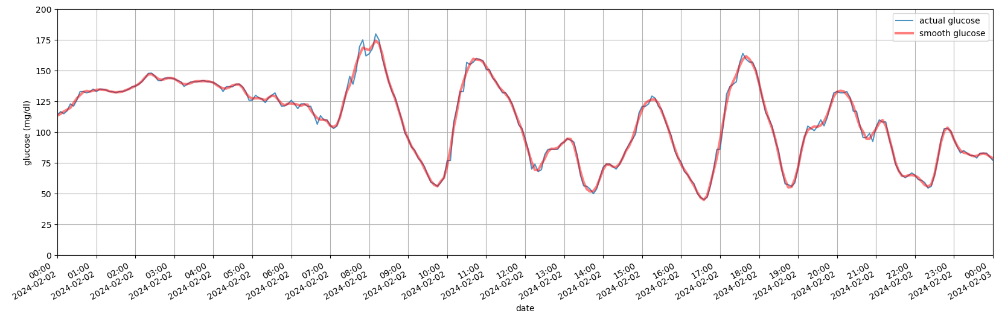

In [11]:
#@title Smooth Glucose

class InvokeButton(object):
  def __init__(self, title, callback):
    self._title = title
    self._callback = callback

  def _repr_html_(self):
    callback_id = 'button-10sasdf'
    co_out.register_callback(callback_id, self._callback)

    template = """<button id="{callback_id}">{title}</button>
        <script>
          document.querySelector("#{callback_id}").onclick = (e) => {{
            google.colab.kernel.invokeFunction('{callback_id}', [], {{}})
            e.preventDefault();
          }};
        </script>"""
    html = template.format(title=self._title, callback_id=callback_id)
    return html

def do_something():
  print('here')



def smooth_glucose(df):
  df = df.copy()
  # df.glucose = df.glucose.rolling(window=timedelta(minutes=15), center=True).mean()
  df.glucose = savgol_filter(df.glucose, window_length=7, polyorder=2)
  df.gl_slope = slope_series(df.glucose, df.index.to_series(), timedelta(minutes=1))
  df.gl_slop2 = slope_series(df.gl_slope, df.index.to_series(), timedelta(minutes=1))
  return df

M.smooth_glucose = False

def ensure_smooth(self, smooth):
  if self.smooth_glucose == smooth: return
  if smooth:
    print('smooth glucose')
    self.raw_glucose = self.glucose
    self.glucose = smooth_glucose(self.glucose)
  else:
    self.glucose = self.raw_glucose
  self.smooth_glucose = smooth
  if (hasattr(self, 'pivot_input')):
    print('pivot input')
    self.pivot_input()
    self.compute_sample_weight()
M.ensure_smooth = ensure_smooth
del ensure_smooth

# InvokeButton('click me', do_something)

m.ensure_smooth(True)

df = smooth_glucose(m.raw_glucose)
mape = mean_absolute_percentage_error(m.raw_glucose.glucose, df.glucose)
print('smoothing mean abs error %.2f%%' % (100*mape))

_, ax = plt.subplots(figsize=(20, 6))
s = pd.to_datetime('2024-02-02')
xlim = (s, s + timedelta(days=1))
ylim = (0, 200)
ax.xaxis.set_major_locator(mdates.HourLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M\n%Y-%m-%d'))
# ax.xaxis.grid(True, which="minor")
# ax.xaxis.grid(True, which="major")

m.raw_glucose.glucose.plot(ax=ax, xlim=xlim, ylim=ylim, alpha=0.8, label='actual glucose')
df.glucose.plot(ax=ax, xlim=xlim, ylim=ylim, color='red', alpha=0.5, linewidth=3, label='smooth glucose')
ax.grid(True)
ax.yaxis.set_label_text('glucose (mg/dl)')
ax.legend()


<IPython.core.display.Javascript object>

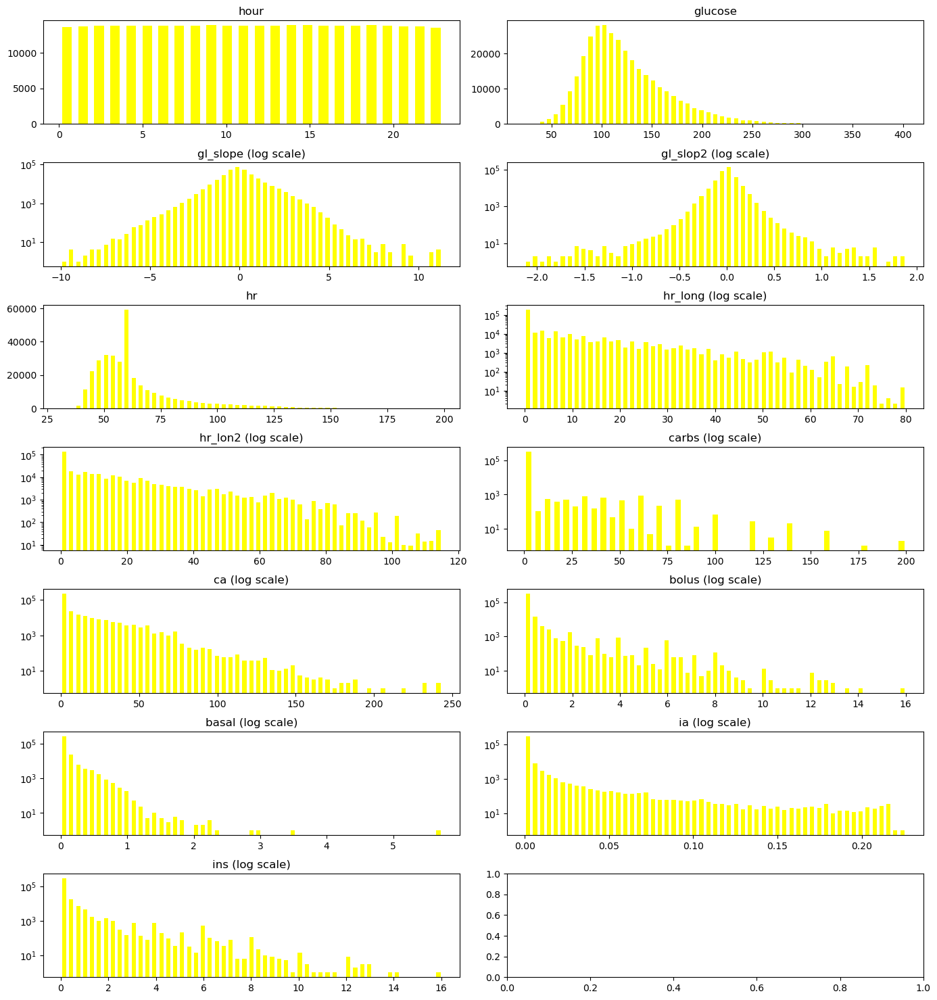

In [12]:
#@title Data Statistics
display(Javascript('''google.colab.output.setIframeHeight(0, true, {maxHeight: 5000})'''))

def statistics(self):
  self.glucose.describe()
  no_log_features = ['hour', 'glucose', 'glucose1', 'gl_pred', 'hr']

  fig, axs = plt.subplots(nrows=(len(self.glucose.columns)+1) // 2, ncols=2, figsize=(14, 15))
  fig.tight_layout(pad=2.0)
  axs = axs.flatten()
  for i, c in enumerate(self.glucose.columns):
    col = self.glucose[c]
    log = c not in no_log_features
    axs[i].hist(
        x=col.values, log=log, bins=min(col.nunique(), 55),
        label=c, rwidth=0.6, color='yellow')
    axs[i].set_title(c + (' (log scale)' if log else ''))

M.statistics=statistics
m.statistics()

In [13]:
# #@title Experimental Insulin Action

# import tensorflow_probability as tfp

# df = m.glucose.copy()
# df['minute15'] = df.index.map(lambda ts: ts.replace(minute=15 * (ts.minute // 15)))


# df - df.groupby(by=['minute15']).mean()



# td = timedelta(minutes=120)
# tdc = timedelta(minutes=60)

# window_th = 0.3

# bolus = df.bolus > 3

# # indexer = pd.api.indexers.FixedForwardWindowIndexer(window_size=td)
# window_bolus = (df
#       .bolus.map(lambda b: b if b > window_th else 0.0)
#       .rolling(window=tdc, center=False)
#       #.apply(lambda b: b[b > window_th]
#       .sum())
# window_carbs = (df
#       .carbs
#       .rolling(window=2*td, center=True)
#       #.apply(lambda b: b[b > window_th]
#       .sum())

# df['clean_bolus'] = (df.bolus == window_bolus) & bolus & (window_carbs < 0.1)

# ts = None
# gl = None
# points = []
# means = []
# modes = []
# for row in df.itertuples():
#   if row.clean_bolus:
#     ts = row.Index
#     gl = row.glucose
#     #print('Start %s bolus=%f' % (str(ts), row.bolus))
#   elif ts is not None and row.Index - ts < td:
#     minutes = int((row.Index-ts)/timedelta(minutes=1))
#     # print('Cont %s bolus=%f slope=%f' % (str(minutes), row.bolus, row.glucose))
#     points.append(row.glucose - gl)
#   elif len(points) > 0 and len(points) > 10:
#     ln = tfp.distributions.LogNormal.experimental_fit(points)
#     mean = ln.mean().numpy()
#     if not np.isnan(mean):
#       means.append(mean)
#       modes.append(ln.mode().numpy() / 12)
#       print('Mean: %f mode: %f' % (mean, ln.mode().numpy() / 4))
#     points = []
#   else:
#     points = []

# pd.Series(modes).median()

# # print('ln %f %f' % (ln.loc, ln.scale))

In [14]:
# ln = tfp.distributions.LogNormal.experimental_fit([1., 2., 1.])

# print(ln)


# print(ln.mean().numpy())
# print(ln.variance().numpy())



# data = ln.sample(10)
# ln1 = tfp.distributions.LogNormal(1, 1)
# data=ln1.sample(100)

# x = np.linspace(0, 10, 100, dtype=np.float64)
# plt.scatter(x=x, y=ln.prob(x), color='red', alpha=0.4)

# # ln1.log_prob([1,2])
# ln1.prob(x)

In [15]:
#@title Adjust for Level Dependent Insulin Sensitivity

def adjust_insulin_sensitivity(self, glucose=None, threshold=60):
  if glucose is None: glucose = self.glucose
  glucose.ia = glucose.ia * glucose.glucose.apply(lambda g: 1 if g > threshold else 1.5)
M.adjust_insulin_sensitivity = adjust_insulin_sensitivity
del adjust_insulin_sensitivity

# m.adjust_insulin_sensitivity()

# Setup and Train Model

In [16]:
def value_col_name(n, m):
  if n == 'glucose': n = 'gl'
  elif n == 'gl_slope': n = 'gls'
  elif n == 'gl_slop2': n = 'gls2'
  elif n == 'heart_rate': n = 'hr'
  return '%s_%03d' % (n, m)
def gl_col_name(m): return value_col_name('glucose', m)
def gl_slope_col_name(m): return value_col_name('gl_slope', m)
def gl_slop2_col_name(m): return value_col_name('gl_slop2', m)
def ia_col_name(m): return value_col_name('ia', m)
def ca_col_name(m): return value_col_name('ca', m)
def hr_col_name(m): return value_col_name('hr', m)

In [17]:
#@title Features

M.features = [
    'hour',
    'glucose',
    'gl_slope',
    'gl_slop2',
    'ins',
    'ia',
    'carbs',
    'ca',
    'hr',
    'hr_long',
    'hr_lon2',
]

class FeatureMode(Enum):
  SKIP = 0,         # Don't use the feature.
  FIRST = 1,        # Use the first value of the period.
  X_MINUTES = 2,    # Use all values in the X period.
  Y_MINUTES = 3,    # Use all values in the Y period.
  Y_FIRST = 6,      # Use all values in the Y period.
  MINUTES = 4,      # Use all values in the period.
  MINUTES_Y0 = 5,   # Use all values in the X period and fill Y with 0.

  def __repr__(self):
    return self.name

  def __eq__(self, other):
    return other is not None and hasattr(other, 'value') and self.value == other.value


def make_feature_def(self, **kwargs):
  unknown = kwargs.keys() - set(self.features)
  if len(unknown) > 0:
    raise Exception('unknown feature(s) %s' % str(unknown))
  return {**{f: FeatureMode.SKIP for f in self.features}, **kwargs}
M.make_feature_def = make_feature_def
del make_feature_def

x_feature_def = M.make_feature_def(M,
    hour=FeatureMode.FIRST,
    glucose=FeatureMode.X_MINUTES,
    gl_slope=FeatureMode.X_MINUTES,
    gl_slop2=FeatureMode.X_MINUTES,
    ins=FeatureMode.X_MINUTES,
    carbs=FeatureMode.X_MINUTES,
    hr=FeatureMode.X_MINUTES,
    hr_long=FeatureMode.X_MINUTES,
    hr_lon2=FeatureMode.X_MINUTES)
M.x_feature_def = x_feature_def
del x_feature_def

y_feature_def = M.make_feature_def(M, gl_slope=FeatureMode.Y_MINUTES)
M.y_feature_def = y_feature_def
del y_feature_def

@property
def used_x_features(self):
  return [f for f in self.features if self.x_feature_def[f] != FeatureMode.SKIP]
M.used_x_features = used_x_features
del used_x_features


@property
def used_y_features(self):
  return [f for f in self.features if self.y_feature_def[f] != FeatureMode.SKIP]
M.used_y_features = used_y_features
del used_y_features

In [18]:
# df = m.glucose.copy()
# df.ins = df.ins.shift(2)
# df.carbs = df.carbs.shift(2)

# m.glucose = df


In [19]:
#@title Pivot Input

def datetime_to_period(self, dt, start_ts):
  t = dt - start_ts
  p = self.PERIOD * (t // self.PERIOD)
  return p + start_ts
M.datetime_to_period = datetime_to_period

def pivot_for_model(self, gl=None, start_ts=None):
  df = (self.glucose if gl is None else gl).copy()
  start_ts = self.start_ts if start_ts is None else start_ts
  if not set(self.features) <= set(df.columns):
    raise Exception('missing column(s) %s' % str(set(self.features) - set(df.columns)))

  # Add a minute column for the minute within a period, e.g. if the period is 4
  # hours (3h x, 1h y) and value frequency is 5 minutes, the minute column has
  # values 0, 5, 10, ... 235.
  df['minute'] = df.index.map(
      lambda dt: self.FREQ_MINUTES * ((dt - self.datetime_to_period(dt, start_ts)) // self.FREQ))
  df.index = df.index.map(lambda ts: self.datetime_to_period(ts, start_ts))
  df.reset_index(inplace=True)

  # Aggregate values, usually we get a single value. Compute the mean if there
  # are multiple.
  def agg(x):
    return float(x if pd.api.types.is_scalar(x) else sum(x) / len(x))
  df = pd.pivot_table(
      df, index=['date'], columns='minute',
      values=self.features,
      aggfunc=dict(hour='min', **{v: agg for v in self.features if v != 'hour'}))

  # Lift the sub-columns up, e.g. rename df['glucose'][5] to df['glucose_005']
  r = pd.concat(
      {value_col_name(v, m): df[v][m] for v in self.features for m in self.PERIOD_INPUT_MINUTES},
      axis=1).dropna()
  if gl is None: self.input = r
  return r
M.pivot_for_model = pivot_for_model
del pivot_for_model

def order_cols(df, cols, fill):
  o = df.copy()
  if fill is None:
    cols = [c for c in cols if c in df.columns]
  else:
    for c in cols:
      if c not in df.columns:
        o[c] = fill
  return o[cols].copy()

def pivot_input(self):
  def pivot(df):
    input = pd.concat(
        [ self.pivot_for_model(
            df[h * 12:],
            start_ts=self.start_ts + timedelta(hours=h))
          for h in range(0, self.MINUTES // 60)])
    return input.sort_index()
  self.input = pivot(self.glucose)
M.pivot_input = pivot_input
del pivot_input

m.pivot_input()
print('input shape %s' % str(m.input.shape))
data_table.DataTable(m.input.head(2000), max_columns=100)
m.input.describe().T


input shape (26960, 528)


,count,mean,std,min,25%,50%,75%,max
hour_000,26960.0,11.438984,6.865016,0.0,6.0,11.0,17.0,23.0
hour_005,26960.0,11.438984,6.865016,0.0,6.0,11.0,17.0,23.0
hour_010,26960.0,11.438984,6.865016,0.0,6.0,11.0,17.0,23.0
hour_015,26960.0,11.438984,6.865016,0.0,6.0,11.0,17.0,23.0
hour_020,26960.0,11.438984,6.865016,0.0,6.0,11.0,17.0,23.0
...,...,...,...,...,...,...,...,...
hr_lon2_215,26960.0,13.099666,17.833864,0.0,0.0,6.0,19.0,114.0
hr_lon2_220,26960.0,13.099815,17.833805,0.0,0.0,6.0,19.0,114.0
hr_lon2_225,26960.0,13.099703,17.832839,0.0,0.0,6.0,19.0,114.0
hr_lon2_230,26960.0,13.099815,17.832495,0.0,0.0,6.0,19.0,114.0


In [20]:
#@title Split Training, Prediction, and Validation Data

M.predict_accumulated_slope = False
M.batch_size = 1  # redefined later

def _mode_to_minutes(self, mode):
  if mode == FeatureMode.FIRST: return ([0],[])
  if mode == FeatureMode.X_MINUTES: return (self.PERIOD_X_MINUTES, [])
  if mode == FeatureMode.Y_MINUTES: return (self.PERIOD_Y_MINUTES, [])
  if mode == FeatureMode.Y_FIRST: return (self.PERIOD_Y_MINUTES[:1], [])
  if mode == FeatureMode.MINUTES: return (self.PERIOD_MINUTES, [])
  if mode == FeatureMode.MINUTES_Y0: return (self.PERIOD_X_MINUTES, self.PERIOD_Y_MINUTES)
  if mode == FeatureMode.SKIP: return ([], [])
  raise Exception('unknown mode "%s"' % (mode))
M._mode_to_minutes = _mode_to_minutes
del _mode_to_minutes

def get_x_values(self):
  names = []
  for feature in self.features:
    for minute in self.PERIOD_MINUTES:
      value_minutes, zero_minutes = self._mode_to_minutes(self.x_feature_def[feature])
      if minute in value_minutes: names.append(value_col_name(feature, minute))
      if minute in zero_minutes: names.append('0')
  return names
M.get_x_values = get_x_values
del get_x_values

def _get_series(self, df, feature, mode, minute):
  value_minutes, zero_minutes = self._mode_to_minutes(mode)
  col = value_col_name(feature, minute)
  if minute in value_minutes: return df[col]
  if minute in zero_minutes: return pd.Series(name=col, index=df.index, data=0.0)
  return None
M._get_series = _get_series
del _get_series

def _series_feature_minute(self, df, feature_def):
  cols = []
  for feature in self.features:
    for minute in self.PERIOD_MINUTES:
      cols.append(self._get_series(df, feature, feature_def[feature], minute))
  return pd.concat(filter(lambda s: s is not None, cols), axis=1)

def _series_minute_feature(self, df, feature_def):
  cols = []
  for minute in self.PERIOD_MINUTES:
    for feature in self.features:
      cols.append(self._get_series(df, feature, feature_def[feature], m))
  return pd.concat(filter(None, cols))

M._get_all_series = _series_feature_minute
del _series_feature_minute
del _series_minute_feature

def take_batches(self, df):
  return df[:self.batch_size * (df.shape[0] // self.batch_size)]
M.take_batches = take_batches
del take_batches

@property
def train(self, df=None):
  if df is None: df = self.input
  return df[df.index < self.validation_start]
M.train = train
del train

@property
def validation(self, df=None):
  if df is None: df = self.input
  return self.take_batches(df[df.index >= self.validation_start])
M.validation = validation
del validation

def x_data(self, df):
  return self._get_all_series(df, self.x_feature_def)
M.x_data = x_data
del x_data

def y_data(self, df):
  return self._get_all_series(df, self.y_feature_def)
M.y_data = y_data
del y_data

def print_xy_shape(name, df):
  print('%s  X = %5d x %3d  Y = %5d x %2d' % (name, *m.x_data(df).shape, *m.y_data(df).shape))

print_xy_shape('All  ', m.input)
print_xy_shape('Train', m.train)
print_xy_shape('Valid', m.validation)

All    X = 26960 x 289  Y = 26960 x 12
Train  X = 25534 x 289  Y = 25534 x 12
Valid  X =  1426 x 289  Y =  1426 x 12


<Axes: >

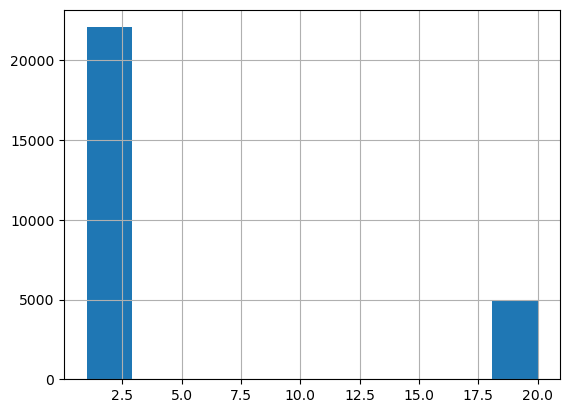

In [21]:
#@title Sample Weights

M.low_glucose = 70
M.high_glucose = 150
M.turn_slope_th = 1
M.low_weight = 1
M.high_weight = 1
M.turn_weight = 20
M.critical_slope = 1.3
M.critical_slope_weight = 1 #1.5
M.active_weight = 1 #3

@property
def last_glucose_col(self):
  return gl_col_name(self.PERIOD_X_MINUTES[-1])
M.last_glucose_col = last_glucose_col

@property
def y_glucose_cols(self):
  return list(map(gl_col_name, self.PERIOD_Y_MINUTES))
M.y_glucose_cols = y_glucose_cols

@property
def gl_slope_cols(self):
  return list(map(gl_slope_col_name, self.PERIOD_Y_MINUTES))
M.gl_slope_cols = gl_slope_cols

@property
def hr_cols(self):
  return list(map(hr_col_name, self.PERIOD_MINUTES))
M.hr_cols = hr_cols
del hr_cols

def active(self, df):
  return df[self.hr_cols].mean() > 90
M.active = active
del active

def compute_sample_weight(self):
  def m(y):
    predict_low = (
        y[self.y_glucose_cols].min() < self.low_glucose and
        y[self.last_glucose_col] > self.low_glucose)
    predict_dec = (
        y[self.last_glucose_col] >  self.critical_slope * y[self.y_glucose_cols].min())
    predict_inc = (
        y[self.last_glucose_col] <  y[self.y_glucose_cols].max() / self.critical_slope)
    predict_turn = (
        y[self.gl_slope_cols].min() < -self.turn_slope_th and
        y[self.gl_slope_cols].max() > self.turn_slope_th)
    active = self.active(y)
    weight = self.low_weight if predict_low else 1
    weight *= self.critical_slope_weight if (predict_dec | predict_inc) else 1
    weight *= self.active_weight if active else 1
    weight = weight * (self.turn_weight if predict_turn else 1)
    return weight
  self.input['sample_weight'] = self.input.apply(m, axis=1)
M.compute_sample_weight = compute_sample_weight
m.compute_sample_weight()

m.input.sample_weight.hist()

In [22]:
# x=m.x_data(m.take_batches(m.validation))

# m.model.predict(x, verbose=0, batch_size=32)

In [24]:
#@title Predict Values

def predict_from_slope(self, features, add_glucose=False):
  v = self.take_batches(features)
  x = self.x_data(v)
  pred_arrays = self.model.predict(x, verbose=0, batch_size=self.batch_size).transpose()
  prediction = pd.DataFrame(index=v.index)
  prev = 0.0
  for i, m in enumerate(self.PERIOD_Y_MINUTES):
    prediction[gl_slope_col_name(m)] = pred_arrays[i] - prev
    if self.predict_accumulated_slope:
      prev = pred_arrays[i]

  if (add_glucose):
    last_value_m = self.PERIOD_X_MINUTES[-1]
    last_glucose_col = gl_col_name(self.PERIOD_X_MINUTES[-1])
    prediction[last_glucose_col] = v[last_glucose_col]
    s = v[last_glucose_col]
    freq = self.FREQ_MINUTES
    for m in self.PERIOD_Y_MINUTES:
      gls = prediction[gl_slope_col_name(m)]
      prediction[gl_col_name(m)] = \
          (m - last_value_m) * gls + prediction[gl_col_name(last_value_m)]
      prediction[gl_col_name(m)].clip(lower=30, upper=300, inplace=True)
      if not self.predict_accumulated_slope:
        last_value_m = m

  return prediction
M.predict_from_slope = predict_from_slope
del predict_from_slope

def predict_from_glucose(self, features):
  v = self.take_batches(features)
  x = self.x_data(v)
  pred_arrays = self.model.predict(x, verbose=0, batch_size=self.batch_size).transpose()
  prediction = pd.DataFrame(index=v.index)

  for i, m in enumerate(self.PERIOD_Y_MINUTES):
    prediction[gl_col_name(m)] = pred_arrays[i]

  last_value_m = self.PERIOD_X_MINUTES[-1]
  last_glucose_col = gl_col_name(last_value_m)
  prediction[last_glucose_col] = v[last_glucose_col]
  freq = self.FREQ_MINUTES
  for m in self.PERIOD_Y_MINUTES:
    glucose_col = gl_col_name(m)
    prediction[gl_slope_col_name(m)] = (
        prediction[glucose_col] - prediction[last_glucose_col]) / freq
    last_glucose_col = gl_col_name(m)
  return prediction
M.predict_from_glucose = predict_from_glucose
del predict_from_glucose

def predict_step_by_step(self, features):
  x = self.x_data(features)
  prediction = pd.DataFrame(index=features.index)
  prev = x[gl_col_name(self.PERIOD_X_MINUTES[-1])]

  for i, s in enumerate(range(180, 180+60, 5)):
    pred_arrays = self.model.predict(x, verbose=0, batch_size=self.batch_size).transpose()
    prediction[gl_col_name(s)] = pred_arrays[0]
    prediction[gl_slope_col_name(s)] = ((prediction[gl_col_name(s)] - prev) / self.FREQ_MINUTES)
    prev = prediction[gl_col_name(s)]

    cols = []
    for minute in self.PERIOD_X_MINUTES[1:]:
      cols.append(x[gl_col_name(minute)].rename(gl_col_name(minute - self.FREQ_MINUTES)))
    cols.append(prediction[gl_col_name(s)].rename(gl_col_name(self.PERIOD_X_MINUTES[-1])))

    x = pd.concat(cols, axis=1)
  return prediction.reindex(sorted(prediction.columns), axis=1)
M.predict_step_by_step = predict_step_by_step
del predict_step_by_step

def predict(self, features, add_glucose=False):
  if self.used_y_features[0] == 'glucose':
    return self.predict_from_glucose(features)
    # return self.predict_step_by_step(features)
  else:
    return self.predict_from_slope(features, add_glucose)
M.predict = predict
del predict

# m.predict_from_glucose(m.validation)

# m.predict(m.validation, True)

In [25]:
df = m.glucose.copy()

df1 = pd.concat([df.glucose.rename('foo'), df.hour], axis=1)

# m.glucose.hour.rename('hour', inplace=True)

# m.glucose[:100]

df1


,foo,hour
date,,
2021-01-01 00:00:00+00:00,129.291446,1
2021-01-01 00:05:00+00:00,125.511943,1
2021-01-01 00:10:00+00:00,121.855946,1
2021-01-01 00:15:00+00:00,118.323457,1
2021-01-01 00:20:00+00:00,114.431610,1
...,...,...
2024-02-29 23:35:00+00:00,95.251118,0
2024-02-29 23:40:00+00:00,98.248062,0
2024-02-29 23:45:00+00:00,102.625957,0


In [26]:
#@title Metrics Logging

def minutes_to_label(self, minutes):
  return minutes + self.TRAIN_MINUTES - self.FREQ_MINUTES
M._minutes_to_label = minutes_to_label

class NullCtxMgr(contextlib.AbstractContextManager):
  def __exit__(self, *args):
    pass

M.tf_writer = None
def log_accuracy(self, epoch, logs):
  if epoch % 5 != 0: return
  data = self.take_batches(self.validation)
  p = self.predict(data, True)
  if p.isnull().values.any(): return
  assert data.shape[0] == p.shape[0]
  with self.tf_writer.as_default():
    for minutes in (30, 60):
      # if self._minutes_to_label(minutes) not in self.PERIOD_Y_MINUTES: continue
      col = gl_slope_col_name(self._minutes_to_label(minutes))
      err = (data[col] - p[col]).abs().mean()
      tf.summary.scalar('slope accuracy %d min' % minutes, err, step=epoch)
      self.metrics.setdefault('sl_acc_%d' % minutes, []).append(err)

      col = gl_col_name(self._minutes_to_label(minutes))
      gerr = mean_absolute_error(data[col], p[col])
      tf.summary.scalar('glucose accuracy %d min' % minutes, gerr, step=epoch)
      self.metrics.setdefault('gl_acc_%d' % minutes, []).append(gerr)
      grerr = 100 * mean_absolute_percentage_error(data[col], p[col])
      tf.summary.scalar('glucose accuracy %% %d min' % minutes, grerr, step=epoch)
      self.metrics.setdefault('gl_acc%%_%d' % minutes, []).append(grerr)
      stdev = (data[col] - p[col]).abs().std()
      tf.summary.scalar('glucose stddev %d min' % minutes, stdev, step=epoch)
      self.metrics.setdefault('stdev_%d' % minutes, []).append(stdev)

M._log_accuracy = log_accuracy

# m._log_accuracy(5, None)
# m.predict(m.validation, True)

In [27]:
#@title Model Helpers

def layer_short_name(l):
  if isinstance(l, tf.keras.layers.Normalization):
    return 'N'
  elif isinstance(l, tf.keras.layers.Dense):
    return 'D(%d%s)' % (l.units, '' if l.activation is None else (', %s'%l.activation))
  elif isinstance(l, tf.keras.layers.Conv1D):
    return 'Conv(%d,%s)' % (l.filters, l.kernel_size)
  elif isinstance(l, tf.keras.layers.Conv1DTranspose):
    return 'ConvT(%d,%s)' % (l.filters, l.kernel_size)
  elif isinstance(l, tf.keras.layers.ConvLSTM1D):
    return 'ConvL(%d,%s)' % (l.filters, l.kernel_size)
  elif isinstance(l, tf.keras.layers.SimpleRNN):
    return 'Rnn(%s)' % (l.units)
  elif isinstance(l, tf.keras.layers.LSTM):
    return 'Lstm(%s)' % (l.units)
  elif isinstance(l, tf.keras.layers.Dropout):
    return 'Drop(%.2f)' % l.rate
  else:
    return l.name[:2]

def concat_layers(n, input, layers, o):
  o.append('[')
  sep = ''
  out = []
  for l in layers:
    o.append(sep)
    out.append(seq_layers(n, input, l, o))
    sep = '|'
  o.append(']')
  return tf.keras.layers.concatenate(out)

def seq_layers(n, input, layers, o):
  c = input
  layers = layers if isinstance(layers, list) else [layers]
  for l in layers:
    if isinstance(l, list):
      c = concat_layers(n + '  ', c, l, o)
    else:
      o.append(layer_short_name(l))
      c = l(c)
      print('%s%s %s' % (n, l.name, getattr(c, 'shape', '-')))
  return c

def normalizer(self):
  x = self.x_data(self.train)
  normalizer = tf.keras.layers.Normalization()
  normalizer.adapt(x)
  return normalizer
M.normalizer = normalizer
del normalizer

Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_27 (Normaliza  (32, 255)                511       
 tion)                                                           
                                                                 
 dense_55 (Dense)            (32, 400)                 102400    
                                                                 
 dense_56 (Dense)            (32, 12)                  4812      
                                                                 
Total params: 107,723
Trainable params: 107,212
Non-trainable params: 511
_________________________________________________________________


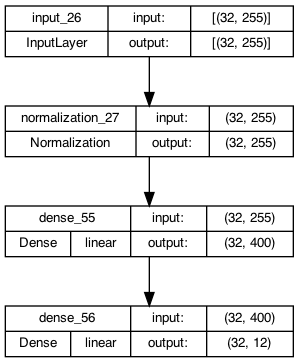

In [81]:
#@title Create Dense Model

def create_model_dense(self):
  self.name = 'default'
  self.x_feature_def = self.make_feature_def(
      hour=FeatureMode.FIRST,
      glucose=FeatureMode.X_MINUTES,
      gl_slope=FeatureMode.X_MINUTES,
      gl_slop2=FeatureMode.X_MINUTES,
      ins=FeatureMode.MINUTES,
      carbs=FeatureMode.MINUTES,
      hr=FeatureMode.MINUTES,
      hr_long=FeatureMode.FIRST,
      hr_lon2=FeatureMode.FIRST
    )
  self.y_feature_def = self.make_feature_def(glucose=FeatureMode.Y_MINUTES)

  self.optimizer_class = tf.keras.optimizers.Adam
  self.optimizer_args = {'learning_rate': 0.0001, 'beta_1': 0.99, 'beta_2': 0.999}

  layers = [
    tf.keras.layers.InputLayer(
        input_shape=self.x_data(self.train).shape[1:], batch_size=self.batch_size),
    self.normalizer(),
    # tf.keras.layers.Dropout(rate=0.2),
    tf.keras.layers.Dense(units=400, activation=None),
    # tf.keras.layers.Dense(units=200, activation='sigmoid'),
    #tf.keras.layers.Dropout(rate=0.1),
    tf.keras.layers.Dense(units=self.y_data(self.train).shape[1])]

  self.model_mnemonic = ''.join([layer_short_name(l) for l in layers])
  return tf.keras.Sequential(layers)
M.create_model_dense = create_model_dense
del create_model_dense

def plot_model(model, node_width=3):
  model.summary()
  dot = tf.keras.utils.model_to_dot(
      model,
      # rankdir='LR',  # remove for larger image
      show_shapes=True,
      show_layer_activations=True)
  for n in dot.get_nodes():
    n.set_fontname('roboto')
    n.set_fontsize(10)
    n.set_width(node_width)
  fname = '/tmp/model.png'
  dot.write(fname, format='png')
  return idisplay.Image(filename=fname)

plot_model(m.create_model_dense())
# help(dot)

min features 8, minutes 48
normalization_1 (64, 384)
  Reshape_2 (64, 8, 48)
  Permute (64, 48, 8)
  Conv_1 (64, 95, 200)
  Reshape_3 (64, 19000)
  Dense_C2 (64, 200)
Dense_O (64, 12)
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Input (InputLayer)          [(64, 384)]               0         
                                                                 
 normalization_1 (Normalizat  (64, 384)                769       
 ion)                                                            
                                                                 
 Reshape_2 (Reshape)         (64, 8, 48)               0         
                                                                 
 Permute (Permute)           (64, 48, 8)               0         
                                                                 
 Conv_1 (Conv1DTranspose)    (64, 95, 200)             77000     
         

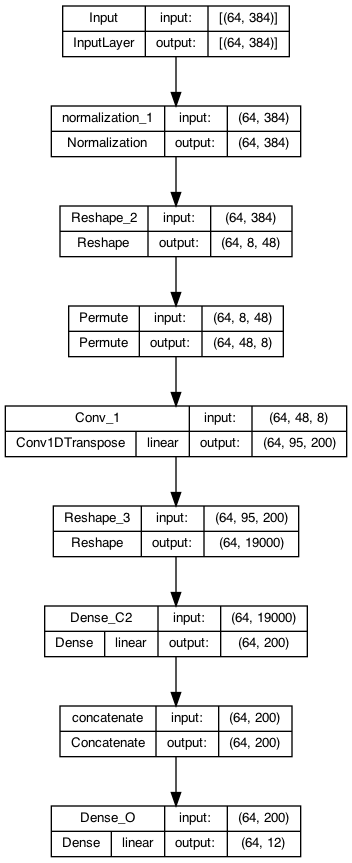

In [29]:
#@title Create Convolution Model
M.batch_size = 64

def create_model_conv(self):
  self.name = 'conv'
  self.optimizer_args = {'learning_rate': 0.00005, 'beta_1': 0.09, 'beta_2': 0.990}
  self.x_feature_def = self.make_feature_def(
      hour=FeatureMode.MINUTES,
      glucose=FeatureMode.MINUTES_Y0,
      gl_slope=FeatureMode.MINUTES_Y0,
      gl_slop2=FeatureMode.MINUTES_Y0,
      ins=FeatureMode.MINUTES,
      carbs=FeatureMode.MINUTES,
      hr=FeatureMode.MINUTES,
      hr_long=FeatureMode.MINUTES)
  self.y_feature_def = self.make_feature_def(glucose=FeatureMode.Y_MINUTES)

  minutely_feature_cnt = len(self.used_x_features)
  min_cnt = len(self.PERIOD_MINUTES)
  print('min features %d, minutes %d' % (minutely_feature_cnt, min_cnt))

  conv1_size = 200
  layers = [
    self.normalizer(),
    [
      [ # Remove hour and hr_long* features.
        # tf.keras.layers.Reshape((len(self.x_cols), 1), name='Reshape_1'),
        # tf.keras.layers.Cropping1D(cropping=(0, 2), name='Crop_1'),
        # Put all values with the same timestamp in one sub-vector.
        tf.keras.layers.Reshape((minutely_feature_cnt, min_cnt), name='Reshape_2'),
        tf.keras.layers.Permute((2, 1), name='Permute'),
        tf.keras.layers.Conv1DTranspose(
            name='Conv_1',
            filters=conv1_size,
            kernel_size=min_cnt,
            input_shape=(None, 1, min_cnt, minutely_feature_cnt)),
        tf.keras.layers.Reshape(((2 * min_cnt -1) * conv1_size,), name='Reshape_3'),
        tf.keras.layers.Dense(name='Dense_C2', units=conv1_size),
      ],
      # [ tf.keras.layers.Dense(300, name='Dense_D1') ],
    ],
    tf.keras.layers.Dense(self.y_data(self.train).shape[1], name='Dense_O'),
  ]

  input_layer = tf.keras.layers.Input(
      shape=self.x_data(self.input).shape[1:], name='Input', batch_size=self.batch_size)

  o = [layer_short_name(input_layer)]
  l = seq_layers('', input_layer, layers, o)
  self.model_mnemonic = ''.join(o)

  return keras.Model(inputs=[input_layer], outputs=[l])
M.create_model_conv = create_model_conv
del create_model_conv

plot_model(m.create_model_conv(), node_width=2)


min features 6, minutes 48
normalization_2 (32, 288)
  Reshape_2 (32, 6, 48)
  Permute (32, 48, 6)
  Rec_1 (32, 200)
  Dense_C2 (32, 200)
Dense_O (32, 12)
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Input (InputLayer)          [(32, 288)]               0         
                                                                 
 normalization_2 (Normalizat  (32, 288)                577       
 ion)                                                            
                                                                 
 Reshape_2 (Reshape)         (32, 6, 48)               0         
                                                                 
 Permute (Permute)           (32, 48, 6)               0         
                                                                 
 Rec_1 (SimpleRNN)           (32, 200)                 41400     
                                    

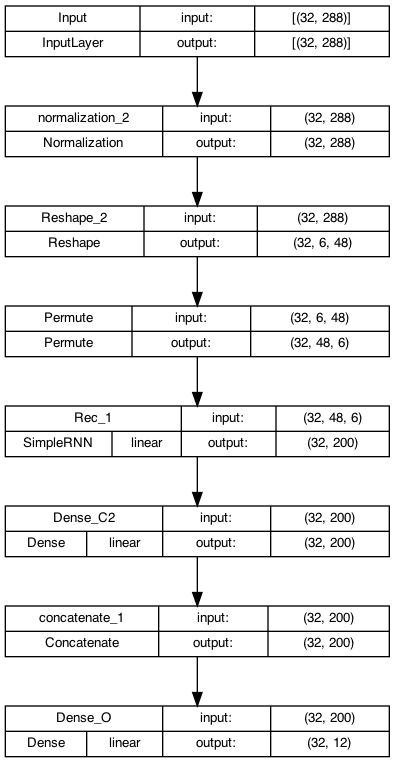

In [30]:
#@title Create Recurrent Model

def create_model_rec(self):
  self.name = 'rec'
  self.batch_size=32
  self.TRAIN_MINUTES = 180
  self.x_feature_def = self.make_feature_def(
      hour=FeatureMode.MINUTES,
      glucose=FeatureMode.MINUTES_Y0,
      gl_slope=FeatureMode.MINUTES_Y0,
      gl_slop2=FeatureMode.MINUTES_Y0,
      ins=FeatureMode.MINUTES,
      carbs=FeatureMode.MINUTES)
  self.y_feature_def = self.make_feature_def(glucose=FeatureMode.Y_MINUTES)
  self.optimizer_args = {'learning_rate': 0.001, 'weight_decay': 0.01} #, 'global_clipnorm': 1.0}
  self.optimizer = tf.keras.optimizers.experimental.Adam

  minutely_feature_cnt = len(self.used_x_features)
  min_cnt = len(self.PERIOD_MINUTES)
  print('min features %d, minutes %d' % (minutely_feature_cnt, min_cnt))

  conv1_size = 200
  layers = [
    self.normalizer(),
    [
      [
        # Put all values with the same timestamp in one sub-vector, i.e.
        # gl_0, gl_5, ..., ins_0, ins_5, ... -> (gl_0, gl_5, ...), (ins_0, ins_5, ...), ...
        tf.keras.layers.Reshape((minutely_feature_cnt, min_cnt), name='Reshape_2'),
        # (gl_0, gl_5, ...), (ins_0, ins_5, ...), ... -> (gl_0, ins_0, ...), (gl_5, ins_5, ...), ...
        tf.keras.layers.Permute((2, 1), name='Permute'),

        tf.keras.layers.SimpleRNN(
            name='Rec_1',
            activation=None,
            #recurrent_activation=None,
            kernel_initializer='random_normal',
            recurrent_initializer='random_normal',
            # stateful=True,
            return_state=False,
            units=conv1_size),
        tf.keras.layers.Dense(name='Dense_C2', units=conv1_size),
      ],
      # [ tf.keras.layers.Dense(300, name='Dense_D1') ],
    ],
    tf.keras.layers.Dense(self.y_data(self.train).shape[1], name='Dense_O'),
  ]

  input_layer = tf.keras.layers.Input(
      shape=self.x_data(self.train).shape[1:], name='Input', batch_size=self.batch_size)
  o = [layer_short_name(input_layer)]
  l = seq_layers('', input_layer, layers, o)
  self.model_mnemonic = ''.join(o)

  return keras.Model(inputs=[input_layer], outputs=[l])
M.create_model_rec = create_model_rec
del create_model_rec

plot_model(m.create_model_rec(), node_width=4)


In [31]:
def active_metrics(self):
  active = self.validation[self.hr_cols].mean(axis=1) > 90
  t = self.validation[active].shape[0]
  print('active rows: %d of %d' % (t, self.validation.shape[0]))
  v = self.take_batches(self.validation[active])
  try:
    pred_active = self.predict(v, True)
  except ValueError:
    print('computing active metric failed')
    return -1

  col = value_col_name('gl', 30 + self.TRAIN_MINUTES - self.FREQ_MINUTES)
  active_mae = mean_absolute_error(pred_active[col], v[col])
  return active_mae
M.active_metrics = active_metrics
del active_metrics

# m.active_metrics()

In [32]:
#@title Fit History Logging
def log_history(self):
  history_row = {
      'name': [self.name],
      'time': [pd.Timestamp.now()],
      'model': [self.model_mnemonic],
      'epochs': self.epochs,
      'batch': self.batch_size,
      'train': self.TRAIN_MINUTES,
      'loss': '%s(%s)' % (self.loss_mnemonic, str(self.loss_args)[1:-1]),
      'optimizer': '%s(%s)' % (self.optimizer.name, str(self.optimizer_args)[1:-1]),
      'start': self.START,
      'end': self.END,
      'train features': ', '.join(self.features),
      'cum_slope': self.predict_accumulated_slope,
      'turn_weight': self.turn_weight,
      'low_weight': self.low_weight,
      'critical_slope_weight': self.critical_slope_weight,
      'shuffle': self.shuffle_input,
      'smooth': self.smooth_glucose,
  }
  for f in ['gls', 'gl']:
    for m in [30, 60]:
      e = self.error_at(f, m).abs()
      k = '%s e%d'% (f, m)
      history_row[k] = [e.mean()]
      k = '%s std%d'% (f, m)
      history_row[k] = [e.std()]
  active_mae = self.active_metrics()
  history_row['act gl e30'] = active_mae

  global history
  history = pd.concat([pd.DataFrame(history_row), history], ignore_index=True)
M.log_history = log_history
del log_history

In [82]:
# %%time
#@title Train Model
display(Javascript('''google.colab.output.setIframeHeight(0, true, {maxHeight: 5000})'''))

M.epochs = 50
M.validation_split = 0.2

M.log_base = os.path.join('/tmp', 'fitlogs')

# M.optimizer_args = {'learning_rate': 0.0005, 'beta_1': 0.99, 'beta_2': 0.999}
# M.optimizer = tf.keras.optimizers.legacy.Adam
M.optimizer_args = {}
M.optimizer_class = tf.keras.optimizers.RMSprop
M.loss_args = {'delta': 1}
M.loss_mnemonic = 'H'
M.loss = tf.keras.losses.Huber
m.predict_accumulated_slope = False
M.shuffle_input = True

def error_at(self, f, m):
  col = value_col_name(f, m + self.TRAIN_MINUTES - self.FREQ_MINUTES)
  print('col %s' % col)
  return self.prediction[col] - self.validation[col]
M.error_at = error_at
del error_at

def train_model(self):
  tf.random.set_seed(78)
  self.batch_size = 32

  self.model = self.create_model_dense()
  print("train model '%s'" % self.name)

  self.optimizer = self.optimizer_class(**self.optimizer_args)
  self.model.compile(
    optimizer=self.optimizer,
    metrics=['mse', 'mae', keras.metrics.LogCoshError(name="logcosh", dtype=None)],
    weighted_metrics=['mse'],
    loss=self.loss(**self.loss_args))

  self.metrics = {}
  log_dir = self.log_base + '/' + datetime.now().strftime("%Y-%m-%dT%H:%M")
  self.tf_writer = tf.summary.create_file_writer(log_dir)

  # align to batch size
  t = self.take_batches(self.train)

  if self.shuffle_input:
    index_list = np.array(t.index)
    np.random.shuffle(np.reshape(index_list, (-1, self.batch_size)))
    t = t.loc[index_list, :]

  batch_count = t.shape[0] // self.batch_size
  v_split = self.batch_size * int(self.validation_split * batch_count)
  print('v_split %d' % v_split)
  t = t[:-v_split]
  v = t[-v_split:]

  print('training data %s validation %s' % (str(t.shape), str(v.shape)))

  self.history = self.model.fit(
      self.x_data(t),
      self.y_data(t),
      validation_data=(self.x_data(v), self.y_data(v)),
      shuffle=False,
      epochs=self.epochs,
      batch_size=self.batch_size,
      sample_weight=t.sample_weight.fillna(1.0).values,
      use_multiprocessing=True,
      callbacks=[
          tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1),
          keras.callbacks.LambdaCallback(on_epoch_end=self._log_accuracy)],
      verbose=0)

  self.metrics.update(self.history.history)
  with self.tf_writer.as_default():
    tf.summary.flush()
  self.tf_writer.close()
  self.tf_writer = None

  self.prediction = self.predict(self.validation, True)
  self.log_history()

M.train_model = train_model
del train_model

m.critical_slope_weight = 1
m.turn_weigth = 4
m.use_conv = True
m.ensure_smooth(True)
m.train_model()

history.to_csv(history_file, index=False)
history[['name', 'time', 'smooth', 'gls e30', 'gls e60', 'gl e30', 'gl e60', 'gl std30', 'act gl e30',
         'epochs', 'batch', 'train', 'loss', 'optimizer', 'start', 'end',
         'model', 'turn_weight', 'low_weight', 'critical_slope_weight']]

<IPython.core.display.Javascript object>

train model 'default'
v_split 5088
training data (20416, 529) validation (5088, 529)
col gls_205
col gls_235
col gl_205
col gl_235
active rows: 105 of 1408


,name,time,smooth,gls e30,gls e60,gl e30,gl e60,gl std30,act gl e30,epochs,batch,train,loss,optimizer,start,end,model,turn_weight,low_weight,critical_slope_weight
0,default,2024-03-06 20:08:57.960231,True,0.705301,0.775362,8.807718,18.607772,9.302221,9.356739,50,32,180,H('delta': 1),"Adam('learning_rate': 0.0001, 'beta_1': 0.99, ...",2021-01-01,2024-03-01,"inND(400, <function linear at 0x16ba682c0>)D(1...",20.0,1.0,1.0
1,default,2024-03-06 20:06:25.981973,True,0.725644,0.793011,9.448132,18.969776,9.493352,9.960590,50,32,180,H('delta': 1),"Adam('learning_rate': 0.0005, 'beta_1': 0.99, ...",2021-01-01,2024-03-01,"inND(400, <function linear at 0x16ba682c0>)D(1...",20.0,1.0,1.0
2,default,2024-03-06 19:56:38.901854,True,0.643515,0.714043,9.425724,18.766295,9.333034,10.545279,50,32,180,H('delta': 1),"Adam('learning_rate': 0.0005, 'beta_1': 0.99, ...",2021-01-01,2024-03-01,"inNDrop(0.20)D(400, <function linear at 0x16ba...",20.0,1.0,1.0
3,default,2024-03-06 19:54:56.409609,True,0.637700,0.804177,9.169620,18.304879,9.183715,9.692285,50,32,180,H('delta': 1),"Adam('learning_rate': 0.002, 'beta_1': 0.99, '...",2021-01-01,2024-03-01,"inNDrop(0.20)D(400, <function linear at 0x16ba...",20.0,1.0,1.0
4,default,2024-03-06 19:53:43.180417,True,2.772827,2.772950,17.911342,23.404103,16.321271,19.911187,50,32,180,H('delta': 1),"Adam('learning_rate': 0.02, 'beta_1': 0.99, 'b...",2021-01-01,2024-03-01,"inNDrop(0.20)D(400, <function linear at 0x16ba...",20.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
308,default,2024-02-05 22:34:03.632093,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100,0,120,H('delta': 0.5),"lAdam('learning_rate': 0.0005, 'beta_1': 0.999)",2021-01-01,2023-12-31,"InN[ReCrRePeConv(5,(36,))ReD(100)|D(100)]D(12)",NaN,NaN,NaN
309,default,2024-02-05 22:29:31.705840,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100,0,120,H('delta': 0.5),"lAdam('learning_rate': 0.0005, 'beta_1': 0.999...",2021-01-01,2023-12-31,"InN[ReCrRePeConv(5,(36,))ReD(100)|D(100)]D(12)",NaN,NaN,NaN
310,default,2024-02-05 22:28:25.810681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100,0,120,H('delta': 0.5),lAdam('learning_rate': 0.0005),2021-01-01,2023-12-31,"InN[ReCrRePeConv(5,(36,))ReD(100)|D(100)]D(12)",NaN,NaN,NaN
311,default,2024-02-05 22:27:19.513885,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100,0,120,H('delta': 0.5),"lAdam('learning_rate': 0.0005, 'beta_1': 0.999)",2021-01-01,2023-12-31,"InN[ReCrRePeConv(5,(36,))ReD(100)|D(100)]D(12)",NaN,NaN,NaN


# Model Evaluation

> Indented block



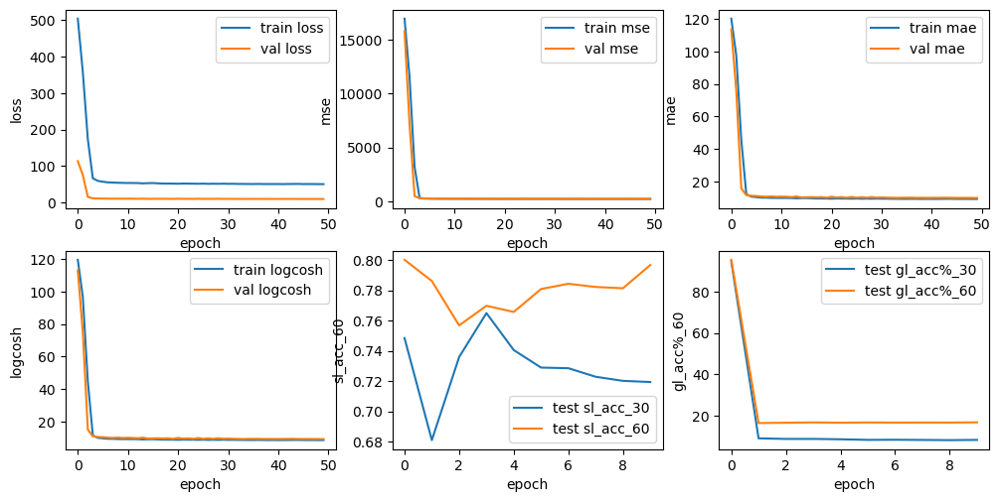

In [80]:
#@title Loss and Metrics

def plot_loss(self, ax, metric):
  if 'val_' + metric in self.metrics.keys():
    ax.plot(self.metrics[metric], label='train ' + metric)
    ax.plot(self.metrics['val_' + metric], label='val ' + metric)
  else:
    ax.plot(self.metrics[metric], label='test ' + metric)
  ax.set_xlabel('epoch')
  ax.set_ylabel(metric)
  ax.legend()
  ax.grid(False)
M.plot_loss = plot_loss

def plot_metrics(self):
  vmetrics = ['loss', 'mse', 'mae', 'logcosh']
  pmetrics = ['sl_acc', 'gl_acc%']
  c = len(vmetrics) + len(pmetrics)
  ncols = 3
  fig, axs = plt.subplots(ncols=ncols, nrows=(c+ncols-1)//ncols, subplot_kw={}, figsize=(10,5))
  axs = axs.flatten()
  fig.tight_layout(pad=1.0)
  for i, m in enumerate(vmetrics): self.plot_loss(axs[i], m)
  for i, m in enumerate(pmetrics):
    self.plot_loss(axs[i+len(vmetrics)], m + '_30')
    self.plot_loss(axs[i+len(vmetrics)], m + '_60')
M.plot_metrics = plot_metrics
del plot_metrics
m.plot_metrics()



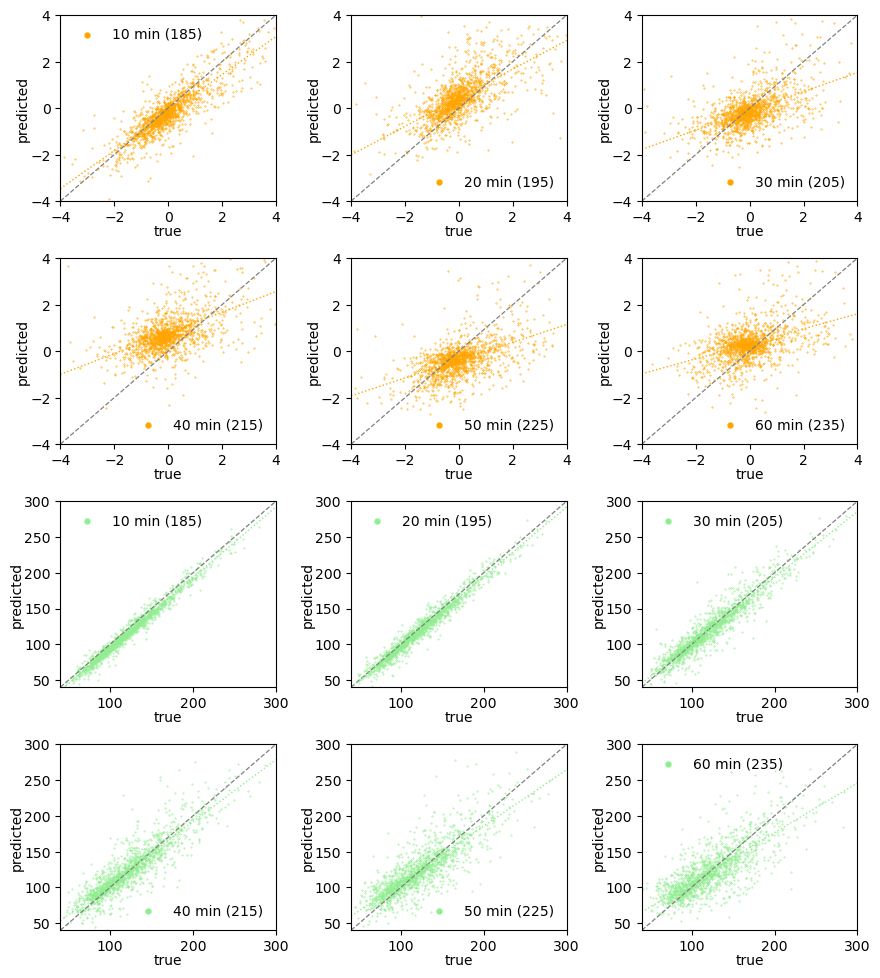

In [74]:
# @title True vs. Predicted Value Plots

def plot_linear_regression(ax, x_series, y_series, color, range):
  length = x_series.shape[0]
  p = np.polyfit(x_series.values, y_series.values, deg=1)
  x_ext = np.linspace(range[0], range[1], length)
  y_ext = np.poly1d(p)(x_ext)
  ax.plot(x_ext, y_ext, color=color, linewidth=1, linestyle='dotted')

def tp_scatter(self, ax, name, pred, true, color, range, minutes):
  m = minutes - self.TRAIN_MINUTES + self.FREQ_MINUTES
  ax.scatter(true[name], pred[name], s=0.5, marker='.', color=color, label='%d min (%d)' % (m, minutes))
  ax.set_xlabel('true', labelpad=0)
  ax.set_ylabel('predicted', labelpad=0)
  ax.set_xlim(range[0], range[1])
  ax.set_ylim(range[0], range[1])
  ax.set_xmargin(20)
  ax.set_label([name])
  ax.legend(markerscale=10, frameon=False)
  ax.plot([0, 1], [0, 1], transform=ax.transAxes, color='grey', linestyle='--', linewidth=0.9)
  plot_linear_regression(ax, true[name], pred[name], color, range)
M._tp_scatter = tp_scatter


def true_pred_plots(self):
  fig, axs = plt.subplots(nrows=4, ncols=3, subplot_kw={}, figsize=(9,10))
  fig.tight_layout(pad=2.0)
  for i, m in enumerate([m for m in self.PERIOD_Y2_MINUTES[1::2]]):
    self._tp_scatter(axs[i//3][i%3], gl_slope_col_name(m), self.prediction, self.validation, color='orange', range=(-4, 4), minutes=m)
  for i, m in enumerate(self.PERIOD_Y2_MINUTES[1::2]):
    self._tp_scatter(axs[2 + i//3][i%3], gl_col_name(m), self.prediction, self.validation, color='lightgreen', range=(40, 300), minutes=m)

M.true_pred_plots = true_pred_plots
m.true_pred_plots()

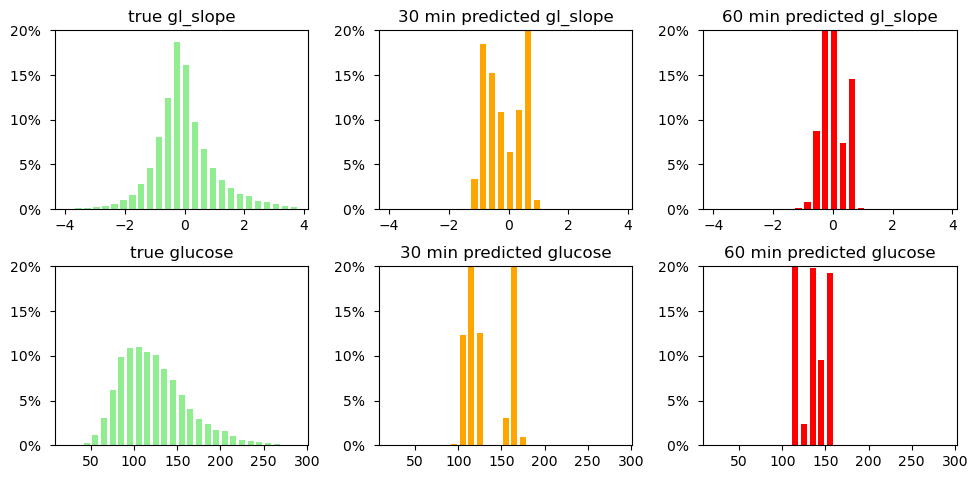

In [36]:
#@title True vs. Predicted Values Histogram
import matplotlib.colors as colors

def frange(f, t, s=1):
  def gen(f, t, s):
    while f < t:
      yield f
      f = round(f + s, 8)
  return list(gen(f, t, s))

def tp_histo(self):
  def hist(ax, x, color, title, bin_range):
    ax.hist(x=x, bins=bin_range,
            rwidth=0.7,
            color=color, weights=np.ones(len(x)) / len(x))
    ax.set_title(title)
    ax.set_ylim(0, 0.2)
    ax.yaxis.set_major_formatter(lambda y, _: '%d%% ' % int(100*y))
  def histos(axs, feature, bin_range):
    hist(axs[0], bin_range=bin_range,
        x=self.glucose[(self.glucose.index >= self.validation_start)][feature],
        color='lightgreen', title='true %s' % feature)
    hist(axs[1], bin_range=bin_range,
         x=self.prediction[value_col_name(feature, self.TRAIN_MINUTES + 25)],
        color='orange', title='30 min predicted %s' % feature)
    hist(axs[2], bin_range=bin_range,
         x=self.prediction[value_col_name(feature, self.TRAIN_MINUTES + 55)],
        color='red', title='60 min predicted %s' % feature)

  fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(10, 5))
  fig.tight_layout(pad=2.0)
  histos(axs[0], 'gl_slope', bin_range=frange(-4, 4, 0.3)),
  histos(axs[1], 'glucose', bin_range=frange(20, 300, 10))

M.tp_histo = tp_histo
del tp_histo
m.tp_histo()

In [37]:
m.prediction.filter([gl_slope_col_name(m) for m in m.PERIOD_Y_MINUTES])
m.y_data(m.validation)

,gl_180,gl_185,gl_190,gl_195,gl_200,gl_205,gl_210,gl_215,gl_220,gl_225,gl_230,gl_235
date,,,,,,,,,,,,
2024-01-01 00:00:00+00:00,97.966520,95.696825,94.982455,96.244909,97.469142,98.288929,98.665300,98.316851,97.167808,95.037640,93.038057,90.935812
2024-01-01 01:00:00+00:00,87.709176,84.848794,83.613679,84.801730,87.686045,90.996799,92.451694,92.483783,92.012656,92.166029,92.325370,93.412965
2024-01-01 02:00:00+00:00,94.811357,95.476670,95.748375,95.665274,95.718700,96.649920,97.348686,95.654152,93.045805,89.934748,87.040313,85.997037
2024-01-01 03:00:00+00:00,85.444283,83.850843,82.377046,80.944741,79.376175,78.305941,77.448798,76.857939,77.193661,78.282369,80.402610,82.566490
2024-01-01 04:00:00+00:00,84.087911,85.388915,87.281574,89.465520,92.619835,94.843619,93.656659,90.727217,87.462998,83.794566,80.235703,77.124627
...,...,...,...,...,...,...,...,...,...,...,...,...
2024-02-29 13:00:00+00:00,148.649481,146.200969,141.750023,134.672979,127.660798,122.001037,117.814680,114.790669,111.430065,107.776961,103.128215,98.315085
2024-02-29 14:00:00+00:00,93.357710,89.227920,85.496462,82.493104,80.018880,78.235070,75.636899,73.058583,69.898243,68.539633,73.148202,82.923753
2024-02-29 15:00:00+00:00,95.636799,107.120000,114.656759,121.142021,128.323367,133.281760,140.374090,145.149770,151.111652,161.053007,169.451293,170.985559


In [38]:
m.input.head(10).T


date,2021-01-01 00:00:00+00:00,2021-01-01 01:00:00+00:00,2021-01-01 02:00:00+00:00,2021-01-01 03:00:00+00:00,2021-01-01 04:00:00+00:00,2021-01-01 05:00:00+00:00,2021-01-01 06:00:00+00:00,2021-01-01 07:00:00+00:00,2021-01-01 08:00:00+00:00,2021-01-01 09:00:00+00:00
hour_000,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0
hour_005,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0
hour_010,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0
hour_015,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0
hour_020,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0
...,...,...,...,...,...,...,...,...,...,...
hr_lon2_220,33.0,33.0,33.0,31.0,20.0,20.0,20.0,20.0,20.0,20.0
hr_lon2_225,33.0,33.0,33.0,30.0,20.0,20.0,20.0,20.0,20.0,20.0
hr_lon2_230,33.0,33.0,33.0,29.0,20.0,20.0,20.0,20.0,20.0,20.0
hr_lon2_235,33.0,33.0,33.0,28.0,20.0,20.0,20.0,20.0,20.0,20.0


T (1424, 12)
P (1424, 12)
mean absolute error: 1.0
mean absolute error perc: 97.7%
root mean squared error: 1.6


,e 10%-ile,e 50%-ile,e 75%-ile,e 90%-ile,e 99%-ile,e% 10%-ile,e% 50%-ile,e% 75%-ile,e% 90%-ile,e% 99%-ile,mae,mape,rmse
minute,,,,,,,,,,,,,
5,0.441768,2.604448,4.672780,6.861473,12.767614,51.307368,99.982021,118.804645,149.247262,192.970206,3.283641,100.193182,4.320989
10,0.122051,0.642894,1.125554,1.728307,3.204071,18.432831,80.671943,131.789888,169.497509,195.452555,0.820617,88.852343,1.079938
15,0.115685,0.686466,1.119563,1.680533,3.047493,33.528673,97.494344,123.633503,162.352089,197.688135,0.816610,98.124966,1.052641
20,0.122874,0.614517,1.170261,1.859370,3.576978,32.415674,98.654620,141.550280,170.328998,197.925875,0.844333,102.092746,1.143487
25,0.112310,0.552872,0.952586,1.594008,3.135688,28.811792,88.175283,137.810021,168.950156,196.943524,0.735851,95.697934,0.996317
30,0.112045,0.635585,1.039155,1.559291,3.012169,19.887030,80.453205,127.633496,161.916348,196.198085,0.771227,86.723837,0.999751
35,0.101057,0.576599,1.065489,1.741922,3.166784,29.731437,94.774122,122.473927,160.170592,195.212909,0.775347,94.178927,1.055812
40,0.120263,0.615937,1.068411,1.631255,3.180108,24.296155,88.539483,132.563348,167.977100,196.014861,0.789213,93.249011,1.039576
45,0.210404,0.910933,1.406567,1.902020,2.992638,36.782612,100.854437,127.778050,164.296800,195.378417,1.008156,100.442341,1.224858


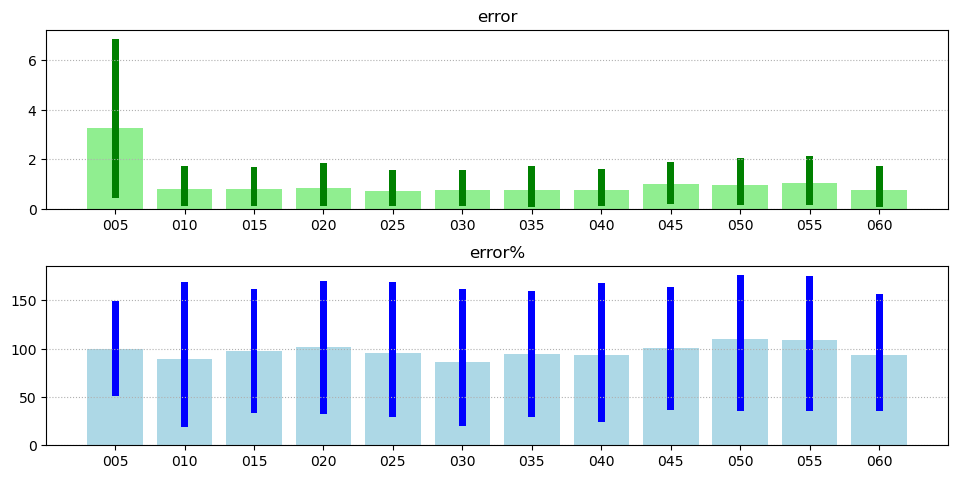

In [39]:
#@title Slope Mean Error and Error Quantiles

def print_errors(self, true, pred):
  print('T ' + str(true.shape))
  print('P ' + str(pred.shape))
  abs_error = (pred - true).abs()
  # mean_abs_error = abs_error.sum().sum() / pred.size
  mean_abs_errors = abs_error.mean()
  mean_squared_errors = (pred - true).pow(2).mean()

  maxv = pred.abs().where(pred.abs() > true.abs(), true.abs())
  abs_error_p = (100 * (pred - true)/maxv).abs()
  mean_abs_errors_p = abs_error_p.sum() / pred.shape[0]

  print("mean absolute error: %.01f" % mean_abs_errors.mean())
  print("mean absolute error perc: %.01f%%" % mean_abs_errors_p.mean())
  print("root mean squared error: %.01f" % np.sqrt(mean_squared_errors.mean()))

  bar_labels = ['%03d' % m for m in range(5, 65, 5)]
  fig, axs = plt.subplots(nrows=2, subplot_kw={}, figsize=(10,5))
  fig.tight_layout(pad=2.0)

  ax = axs[0]
  ax.set_title("error")
  ax.bar(bar_labels, mean_abs_errors.values, color='lightgreen')
  ax.bar(bar_labels,
        (abs_error.quantile(q=0.9)-abs_error.quantile(q=0.1)).values,
        bottom=abs_error.quantile(q=0.1).values, width=0.1, color='green')
  ax.grid(True, which='major', axis='y', ls=':')
  ax = axs[1]
  ax.set_title("error%")
  ax.bar(bar_labels, mean_abs_errors_p.values, color='lightblue')
  ax.bar(bar_labels,
        (abs_error_p.quantile(q=0.9)-abs_error_p.quantile(q=0.1)).values,
        bottom=abs_error_p.quantile(q=0.1).values, width=0.1, color='blue')
  ax.grid(True, which='major', axis='y', ls=':')

  cols = {'%s %.0f%%-ile' % (n, 100 * q): ae.quantile(q=q) for n, ae in [('e', abs_error), ('e%', abs_error_p)] for q in [0.1, 0.5, 0.75, 0.9, 0.99]}
  cols['minute'] = [minute - self.TRAIN_MINUTES + self.FREQ_MINUTES for minute in self.PERIOD_Y2_MINUTES ]
  cols['mae'] = mean_abs_errors
  cols['mape'] = mean_abs_errors_p
  cols['rmse'] = mean_squared_errors.apply(np.sqrt)
  return pd.DataFrame(cols).set_index('minute')
M.print_errors = print_errors

def print_slope_errors(self):
  return m.print_errors(
      self.validation.filter([gl_slope_col_name(m) for m in self.PERIOD_Y2_MINUTES]),
      self.prediction.filter([gl_slope_col_name(m) for m in self.PERIOD_Y2_MINUTES]))
M.print_slope_errors = print_slope_errors

pd.set_option('display.max_rows', 30)
data_table.DataTable(m.print_slope_errors(), num_rows_per_page=12)

T (1408, 12)
P (1408, 12)
mean absolute error: 11.1
mean absolute error perc: 8.6%
root mean squared error: 16.5


,e 10%-ile,e 50%-ile,e 75%-ile,e 90%-ile,e 99%-ile,e% 10%-ile,e% 50%-ile,e% 75%-ile,e% 90%-ile,e% 99%-ile,mae,mape,rmse
minute,,,,,,,,,,,,,
5,1.457386,5.434285,7.988989,10.915886,20.685797,1.191994,4.654416,6.910772,9.816618,20.842256,6.177578,5.360436,7.504810
10,1.547382,6.312136,8.892363,12.344683,22.487279,1.368596,5.315212,7.521666,10.567339,22.916343,6.904201,5.948941,8.339176
15,1.608775,6.118352,8.946710,12.871493,24.185981,1.306460,5.121817,7.439276,10.602627,23.882962,6.897095,5.932888,8.526453
20,0.851311,4.862243,8.352886,13.516653,24.772481,0.777249,4.068277,6.976868,10.425486,23.082380,6.230556,5.204865,8.273705
25,0.913647,5.233895,9.778300,16.033238,30.476382,0.788232,4.279116,7.711353,12.684592,26.815051,7.132369,5.799013,9.912388
30,1.017201,6.401255,12.099453,20.993472,40.043384,0.876514,5.349223,10.033770,16.106122,31.907004,9.169620,7.284480,12.975464
35,1.366872,8.101117,15.312151,25.046233,50.165242,1.138272,6.513436,11.675065,19.385538,36.379542,11.193907,8.674007,15.823961
40,1.633258,8.861774,17.733521,29.415550,57.181261,1.389505,7.422639,13.747346,22.860299,38.560147,12.964647,9.879221,18.382665
45,1.697335,10.300659,20.535800,33.117953,66.771888,1.440888,8.341856,15.907366,24.617687,42.477008,14.773501,11.077274,20.805137


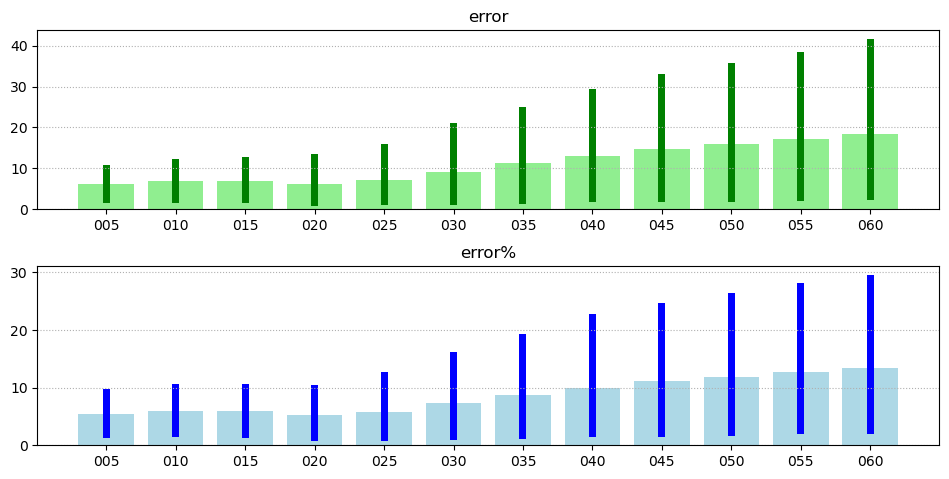

In [73]:
#@title Glucose Mean Error and Error Quantiles
def print_glucose_errors(self):
  return m.print_errors(
      self.validation.reset_index().filter([gl_col_name(m) for m in self.PERIOD_Y2_MINUTES]),
      self.prediction.reset_index().filter([gl_col_name(m) for m in self.PERIOD_Y2_MINUTES]))
M.print_glucose_errors = print_glucose_errors

data_table.DataTable(m.print_glucose_errors())

# Scenarios

In [41]:
#@title Add Prediction to Input

def add_prediction(self, gl=None, start_ts=None):
  input, glucose = (self.input, self.glucose) \
      if gl is None else (self.pivot_for_model(gl, start_ts=start_ts), gl)

  p = self.predict(input, add_glucose=True)
  p = p.filter([value_col_name(c, m)
      for c in ['gls', 'gl']
      for m in self.PERIOD_Y_MINUTES]).reset_index()
  p = pd.wide_to_long(p, stubnames=['gls_', 'gl_'], i='date', j='minute')
  p = p.reset_index()
  p['date'] = p.apply(lambda r: r.date + timedelta(minutes=r.minute), axis=1)
  p = p.copy()
  p.rename({'gls_': 'gl_slope', 'gl_': 'glucose'}, inplace=True, axis=1)
  p.sort_values(by='date', inplace=True)
  p.set_index('date', inplace=True)
  glucose['gl_pred'] = p['glucose']
  return p

M.add_prediction = add_prediction
del add_prediction
m.add_prediction()


,minute,gl_slope,glucose
date,,,
2021-01-01 03:00:00+00:00,180,0.144162,120.108292
2021-01-01 03:05:00+00:00,185,-0.633340,116.941589
2021-01-01 03:10:00+00:00,190,0.370052,118.791847
2021-01-01 03:15:00+00:00,195,0.194501,119.764351
2021-01-01 03:20:00+00:00,200,-0.321431,118.157196
...,...,...,...
2024-02-29 22:35:00+00:00,215,-0.068791,123.386909
2024-02-29 22:40:00+00:00,220,0.772375,127.248787
2024-02-29 22:45:00+00:00,225,-0.702046,123.738556


In [42]:
#@title Timeline Date

start_date = '2023-11-09' # @param{type: 'date'}
days = 10 # @param{type:'slider', min: 0, max: 30}
tt = timedelta(days=days)
start = pd.to_datetime(start_date)

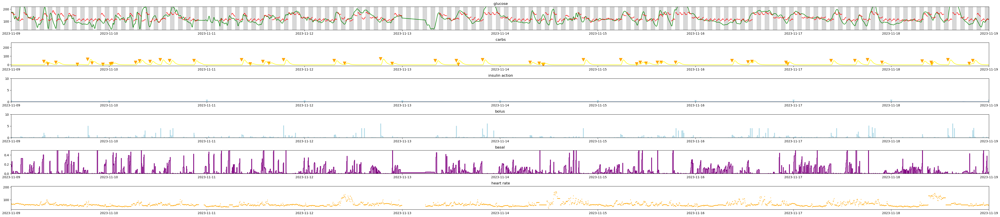

In [43]:
#@title History Timeline

date_range = start, start + tt

def plot_timeline(axs, gl, title=None, date_range=None, glucose_range=(30, 220)):
  carbs = gl[gl.carbs > 0]
  bolus =gl[gl.bolus > 0].reset_index()
  axs[0].set_ylim(glucose_range[0], glucose_range[1])
  axs[2].set_ylim(0, 10)
  date_range = date_range or (gl.index.min(), gl.index.max())
  for ax in axs: ax.set_xlim(date_range)
  axs[0].plot_date(gl.index, gl['glucose'], linestyle='-', markersize=0, color='green')
  axs[0].plot_date(gl.index, gl['gl_pred'], linestyle='-', markersize=0, color='red')
  for dt in pd.date_range(start=date_range[0], end=date_range[1], freq=timedelta(hours=2)):
    s = mdates.date2num(dt + timedelta(hours=1))
    e = mdates.date2num(dt + timedelta(hours=2))
    r = Rectangle((s, glucose_range[0]), e-s, glucose_range[1], color='grey', alpha=0.3)
    axs[0].add_patch(r)
  axs[1].plot_date(gl.index, gl['ca'], linestyle='-', markersize=0, color='yellow')
  axs[1].plot_date(carbs.index, carbs['carbs'], fmt='v', markersize=10, color='orange', zorder=1)
  axs[2].plot_date(gl.index, gl['ia'], linestyle='-', markersize=0, color='royalblue')
  axs[2].plot_date(bolus.index, bolus['bolus'], fmt='v', color='lightblue')
  axs[0].set_title("%s glucose" % (title or ''))
  axs[1].set_title("%s carbs" % (title or ''))
  axs[2].set_title("%s insulin action" % (title or ''))
  axs[-1].plot_date(
      gl.index, gl['hr'], linestyle='', markersize=1, color='orange')
  axs[-1].set_title("%s heart rate" % (title or ''))

def plot_basal(ax, x, y, color=None):
  ax.plot_date(
      x='x', y='y', color=color, data={'x':x,'y':y},
      drawstyle='steps-post', linestyle='-', markersize=0)
  ax.fill_between(x=x, y1=y, color=color, alpha=0.5, step='post')

def plot_history_timeline(self):
  x = self.glucose.copy()
  x.gl_pred = x.gl_pred.where(x.index.minute != 0)
  fig, axs = plt.subplots(nrows=6, subplot_kw={}, figsize=(45,10))
  fig.tight_layout(pad=2.0)
  plot_timeline(axs, x, date_range=date_range)
  axs[2].plot_date(
      self.glucose.index,
      self.glucose['ia'],
      linestyle='-',
      markersize=0, color='steelblue')
  axs[2].fill_between(self.glucose.index, self.glucose.ia, alpha=0.5)

  axs[3].set_title('bolus')
  plot_basal(axs[3], color='lightblue', x=self.glucose.index, y=self.glucose.bolus)
  axs[3].set_ylim(0, 10)
  axs[4].set_title('basal')
  plot_basal(axs[4], color='purple', x=self.glucose.index, y=self.glucose.basal)
  axs[4].set_ylim(0, 0.5)
M.plot_history_timeline = plot_history_timeline
del plot_history_timeline

m.plot_history_timeline()

plot const 80 mg/dl
plot constant 120 mg/dl
plot constant 120 mg/dl; 150 bpm
plot constant 170 mg/dl
plot 50g carbs
plot Inc glucose, 50g carbs
plot 5 I.U. insulin
plot 10 I.U. insulin
plot Inc glucose, 10 I.U. insulin


,glucose,basal,hour,gl_slope,gl_slop2,ins,ia,ca,hr,hr_long,hr_lon2,minute,carbs,bolus,gl_pred
date,,,,,,,,,,,,,,,
2023-11-01 12:00:00+00:00,80.0,0.4,13,0.0,0.0,0.4,0.0,0.0,60.0,0.0,0.0,0,0.0,0.0,NaN
2023-11-01 12:05:00+00:00,80.0,0.4,13,0.0,0.0,0.4,0.000032,0.0,60.0,0.0,0.0,5,0.0,0.0,NaN
2023-11-01 12:10:00+00:00,80.0,0.4,13,0.0,0.0,0.4,0.016982,0.0,60.0,0.0,0.0,10,0.0,0.0,NaN
2023-11-01 12:15:00+00:00,80.0,0.4,13,0.0,0.0,0.4,0.181094,0.0,60.0,0.0,0.0,15,0.0,0.0,NaN
2023-11-01 12:20:00+00:00,80.0,0.4,13,0.0,0.0,0.4,0.621725,0.0,60.0,0.0,0.0,20,0.0,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-11-01 15:35:00+00:00,80.0,0.0,16,0.0,0.0,0.0,2.094005,0.0,60.0,0.0,0.0,215,0.0,0.0,115.603905
2023-11-01 15:40:00+00:00,80.0,0.0,16,0.0,0.0,0.0,1.525318,0.0,60.0,0.0,0.0,220,0.0,0.0,121.776215
2023-11-01 15:45:00+00:00,80.0,0.0,16,0.0,0.0,0.0,1.084689,0.0,60.0,0.0,0.0,225,0.0,0.0,119.125092


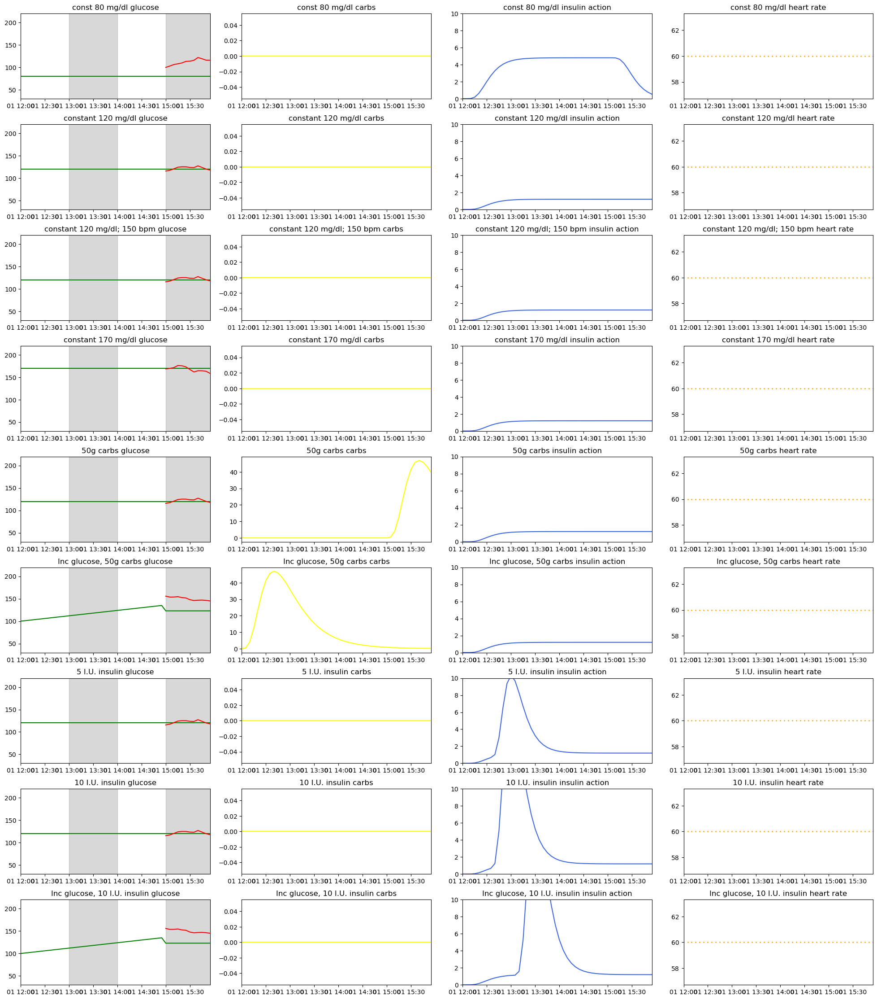

In [44]:
#@title Artificial Scenarios
m.test_data = []

def create_static_data(self, name, glucose, basal, carb_events, insulin_events, hr=60.0, hr_long=0.0):
  bs = self.batch_size
  self.batch_size = 1
  row_count = len(self.PERIOD_MINUTES)
  if np.isscalar(glucose): glucose = row_count * [glucose]
  if np.isscalar(basal): basal = row_count * [basal]
  glucose_range=(30, 180)
  start = pd.to_datetime('2023-11-01T12:00Z')
  df = pd.DataFrame({
      'date': pd.date_range(start, periods=row_count, freq=self.FREQ),
      'glucose': map(float, glucose),
      'basal': basal })
  df['hour'] = df.date.map(lambda ts: ts.astimezone('CET').hour)

  d, v = zip(*carb_events) if carb_events else ([], [])
  carbs = pd.DataFrame({ 'date': d, 'carbs': v})
  d, v = zip(*insulin_events) if insulin_events else ([], [])
  insulin = pd.DataFrame({ 'date': d, 'bolus': v })

  df['gl_slope'] = slope_series(df.glucose, df.date, timedelta(minutes=1)).fillna(0.0)
  df['gl_slop2'] = slope_series(df.gl_slope, df.date, timedelta(minutes=1)).fillna(0.0)
  df.set_index('date', inplace=True)
  df['ins'] = insulin.set_index('date').bolus
  df['ins'].fillna(0.0, inplace=True)
  df['ins'] += df.basal
  df.reset_index(inplace=True)
  df['ia1'] = (
      np.array(self.INSULIN_ACTION.values_at(
          insulin.date.values, insulin.bolus.values, df.date.values)))
  df['ia2'] = (
      np.array(self.INSULIN_ACTION.values_at(
          df.date.values, df.basal.values, df.date.values)))
  df['ia'] = df.ia1 + df.ia2
  df.pop('ia1')
  df.pop('ia2')
  df['ca'] = np.array(self.CARB_ACTION.values_at(
      carbs['date'].values, carbs['carbs'].values, df['date'].values))
  df['hr'] = np.array(row_count * [hr])
  df['hr_long'] = np.array(row_count * [hr_long])
  df['hr_lon2'] = np.array(row_count * [hr_long])
  df['minute'] = ((df['date'] - df['date'][0]) / timedelta(minutes=1)).astype(int)

  df.set_index('date', inplace=True)
  df['carbs'] = carbs.carbs
  df.carbs.fillna(0.0, inplace=True)
  df['bolus'] = insulin.bolus
  df.bolus.fillna(0.0, inplace=True)

  p = self.add_prediction(df, start_ts=start)
  inputVector = self.x_data(self.pivot_for_model(df, start_ts=start)).values[0].tolist()

  df.reset_index(inplace=True)
  to_dv = lambda dv: {'timestamp': str(dv[0]), 'value': dv[1] }
  map_dv = lambda dvs: list(map(to_dv, dvs))

  self.test_data.append({'at': str(df['date'][0])})
  self.test_data[-1]['name'] = name
  self.test_data[-1]['basal'] = map_dv(
      sorted(list(zip(map(str, df.date), len(self.PERIOD_MINUTES)*df.basal))))
  self.test_data[-1]['inputData'] = df.drop(['date'], axis=1).to_dict(orient='list')
  self.test_data[-1]['inputVector'] = inputVector
  self.test_data[-1]['insulinEvents'] = map_dv(insulin_events)
  self.test_data[-1]['carbEvents'] = map_dv(carb_events)
  self.test_data[-1]['heartRates'] = row_count * [hr]
  self.test_data[-1]['hrLongCounts'] = 2 * [hr_long]
  self.test_data[-1]['outputSlopes'] = p.gl_slope.tolist()
  self.test_data[-1]['outputGlucose'] = p.glucose.tolist()

  df.set_index('date', inplace=True)
  self.batch_size = bs
  return (name, df)
M.create_static_data = create_static_data
del create_static_data

x_len = len(m.PERIOD_X_MINUTES)
y_len = len(m.PERIOD_Y_MINUTES)

inc_glucose = list(list(range(100, 100 + len(m.PERIOD_X_MINUTES))) + (len(m.PERIOD_Y_MINUTES) * [123]))

gics = [
    m.create_static_data('const 80 mg/dl', 80, (x_len*[0.4])+(y_len*[0.0]), [], []),
    m.create_static_data('constant 120 mg/dl', 120, 0.1, [], []),
    m.create_static_data('constant 120 mg/dl; 150 bpm', 120, 0.1, [], [], hr_long=100),
    m.create_static_data('constant 170 mg/dl', 170, 0.1, [], []),
    m.create_static_data('50g carbs', 120, 0.1, [(pd.to_datetime('2023-11-01T14:55Z'), 50)], []),
    m.create_static_data('Inc glucose, 50g carbs', inc_glucose, 0.1, [(pd.to_datetime('2023-11-01T11:55Z'), 50)], []),
    m.create_static_data('5 I.U. insulin', 120, 0.1, [], [(pd.to_datetime('2023-11-01T12:30Z'), 5)]),
    m.create_static_data('10 I.U. insulin', 120, 0.1, [], [(pd.to_datetime('2023-11-01T12:30Z'), 10)]),
    m.create_static_data(
        'Inc glucose, 10 I.U. insulin',
        inc_glucose,
        0.1,
         [],
         [(pd.to_datetime('2023-11-01T13:00Z'), 10)]),
]


# gics[0][1]
fig, axs = plt.subplots(nrows=len(gics), ncols=4, subplot_kw={}, figsize=(20, 2.5 * len(gics)))
fig.tight_layout(pad=2.0)

for ax, ndf in zip(axs, gics):
  n, df = ndf
  print('plot ' + n)
  plot_timeline(ax, df, title=n)


# x =m.create_static_data('5 I.U. insulin', 120, 0.1, [], [(pd.to_datetime('2023-11-01T12:30Z'), 5)])
gics[0][1]

# Write Model

In [45]:
#@title Write Model

def write_model(self, model=None):
  if model is None: model = self.model
  self.write_meta_json(os.path.join(CACHE_DIR, 'glucose_model.json'))
  converter = tf.lite.TFLiteConverter.from_keras_model(model)
  converter.inference_input_type = tf.float32
  tflite_model_bytes = converter.convert()
  tflite_model = tf.lite.Interpreter(model_content=tflite_model_bytes)
  tflite_model_path = os.path.join(CACHE_DIR, 'glucose_model.tflite')
  with open(tflite_model_path, 'wb') as f:
    f.write(tflite_model_bytes)
M.write_model = write_model
del write_model
m.write_model()



INFO:tensorflow:Assets written to: /var/folders/98/yh978f1j4zq_ps8kx_9_wmy00000gn/T/tmp2w3pp_6h/assets


INFO:tensorflow:Assets written to: /var/folders/98/yh978f1j4zq_ps8kx_9_wmy00000gn/T/tmp2w3pp_6h/assets
2024-03-06 19:13:28.249398: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:364] Ignored output_format.
2024-03-06 19:13:28.249409: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:367] Ignored drop_control_dependency.
2024-03-06 19:13:28.249748: I tensorflow/cc/saved_model/reader.cc:45] Reading SavedModel from: /var/folders/98/yh978f1j4zq_ps8kx_9_wmy00000gn/T/tmp2w3pp_6h
2024-03-06 19:13:28.250412: I tensorflow/cc/saved_model/reader.cc:89] Reading meta graph with tags { serve }
2024-03-06 19:13:28.250416: I tensorflow/cc/saved_model/reader.cc:130] Reading SavedModel debug info (if present) from: /var/folders/98/yh978f1j4zq_ps8kx_9_wmy00000gn/T/tmp2w3pp_6h
2024-03-06 19:13:28.252337: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:353] MLIR V1 optimization pass is not enabled
2024-03-06 19:13:28.252854: I tensorflow/cc/saved_model/load

# Linear Regression

In [46]:
from sklearn.linear_model import LinearRegression

model = LinearRegression(fit_intercept=True)

x_cols = ['ia', 'ca']
y_cols = ['gl_slope']

train = m.glucose.dropna().head(1000).copy()
x = train[x_cols]
y = train[y_cols]

model.fit(x, y)

score = model.score(x, y)
print('score %f coef: %s %f' % (score, str(model.coef_), model.intercept_))

pred = model.predict(train[x_cols])

train['pred'] = pred

(train.gl_slope - train.pred).abs().mean()
# print('pred %s %s' % (str(pred), str(train[y_cols][-6:].values)))

score 0.028685 coef: [[ 6.12687459e+01 -1.19670537e-02]] 0.083023


0.7892239187133386

In [47]:
train.glucose.diff()

date
2021-01-01 03:00:00+00:00          NaN
2021-01-01 03:05:00+00:00     0.531396
2021-01-01 03:10:00+00:00     0.648610
2021-01-01 03:15:00+00:00     0.052310
2021-01-01 03:20:00+00:00    -0.809466
                               ...    
2021-01-04 18:55:00+00:00    -0.602792
2021-01-04 19:00:00+00:00     3.257917
2021-01-04 19:05:00+00:00     8.786589
2021-01-04 19:10:00+00:00    14.166648
2021-01-04 19:15:00+00:00    16.144259
Name: glucose, Length: 1000, dtype: float64

In [48]:
lr = LinearRegression(fit_intercept=False)

train = m.glucose.head(1000).copy()
train.gl_slope = train.glucose.diff()

train_n = train.shift(-6)

train['ia_n'] = train_n.ia
train['ca_n'] = train_n.ca
train['gls_n'] = train_n.gl_slope
train['glu_n'] = train_n.glucose
train['ia_r'] =  train.ia_n / train.ia
train['ca_r'] =  train.ca_n / (train.ca + 0.01)
train['hr_r'] =  train_n.hr / train.hr

train.dropna(inplace=True)

x_cols = ['glucose', 'gl_slope', 'ia_r', 'ca_r']
y_col = 'glu_n'
lr.fit(train[x_cols], train[y_col])
s = lr.score(train[x_cols], train['glu_n'])
print('score %f coef: %s %f' % (score, str(lr.coef_), lr.intercept_))

train['pred'] = lr.predict(train[x_cols])
err = mean_absolute_error(train[y_col], train['pred'])
perr = mean_absolute_percentage_error(train[y_col], train['pred'])
var = (train[y_col] - train['pred']).abs().std()
print('mean abs err: %.2f %.2f%% %.2f' % (err, 100*perr, var))

train.head(100)


score 0.028685 coef: [0.95879379 2.42096325 0.00753559 0.01413563] 0.000000
mean abs err: 16.35 15.27% 14.84


,hour,glucose,gl_slope,gl_slop2,hr,hr_long,hr_lon2,carbs,ca,bolus,basal,ia,ins,gl_pred,ia_n,ca_n,gls_n,glu_n,ia_r,ca_r,hr_r,pred
date,,,,,,,,,,,,,,,,,,,,,,
2021-01-01 03:00:00+00:00,4,119.222272,-0.165211,0.004689,54.0,19.0,33.0,0.0,0.000000,0.0,0.088589,0.000812,0.088589,120.108292,0.000412,0.000000,-0.480403,118.221170,0.507123,0.000000,1.048148,113.913427
2021-01-01 03:05:00+00:00,4,119.753668,0.531396,-0.023852,54.4,19.0,33.0,0.0,0.000000,0.0,0.094384,0.000731,0.094384,116.941589,0.000362,0.000000,-0.099755,118.121415,0.494622,0.000000,1.029412,116.109292
2021-01-01 03:10:00+00:00,4,120.402278,0.648610,-0.034471,55.4,19.0,33.0,0.0,0.000000,0.1,0.100300,0.000657,0.200300,118.791847,0.000335,0.000000,-0.437852,117.683562,0.509805,0.000000,1.010830,117.015060
2021-01-01 03:15:00+00:00,4,120.454589,0.052310,-0.005363,56.0,19.0,33.0,0.0,0.000000,0.0,0.041508,0.000588,0.041508,119.764351,0.000307,0.000000,-1.489424,116.194139,0.522445,0.000000,0.971429,115.621690
2021-01-01 03:20:00+00:00,4,119.645122,-0.809466,0.018526,56.0,19.0,33.0,0.0,0.000000,0.0,0.039848,0.000524,0.039848,118.157196,0.000283,0.000000,-1.540403,114.653735,0.538774,0.000000,0.950000,112.759373
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-01-01 10:55:00+00:00,11,89.195148,-1.102297,0.048586,67.2,0.0,20.0,0.0,2.066680,0.0,0.000000,0.000094,0.000000,115.671051,0.000092,0.817706,2.937251,104.985988,0.984405,0.393756,0.866071,82.864117
2021-01-01 11:00:00+00:00,12,89.398565,0.203418,0.050934,69.2,0.0,20.0,0.0,1.765637,0.0,0.074165,0.000071,0.074165,99.776962,0.000075,0.703573,0.730399,105.716387,1.067459,0.396237,0.965318,86.220902
2021-01-01 11:05:00+00:00,12,90.816625,1.418059,0.060020,60.6,0.0,20.0,0.0,1.510138,0.0,0.056140,0.000052,0.056140,102.758698,0.000061,0.606113,-1.124967,104.591420,1.185330,0.398723,1.151815,90.522054


In [49]:
x = [[1.49], [1.65]]
y = [-0.06, -0.36]

lr = LinearRegression()
lr.fit(x, y)
print(lr.score(x, y))
print([lr.coef_, lr.intercept_])

1.65 * lr.coef_[0] + lr.intercept_


1.0
[array([-1.875]), 2.733750000000001]


-0.3600000000000003